# THE LOOPER 
# Part II: Elemental abundances

version: 06.11.24

### This Notebook:

 1) Measures EWs for lines of other elements using pyEW package.

2) Generates plots displaying Gaussian and optionally Multigaussian, and Voigt fits for individual lines.

3) Measures elemental abundances with MOOG using q<sup>2</sup> Python package, using stellar parameters and iron abundances derived in Part I.

4) Applies HFS corrections
5) Applies NLTE corrections 
6) Makes nice abundance plots

## <span style="color:blue;">Before running this Notebook, ensure you have the following outputs from Part1:</span> ##

* File with solution <span style="color: blue; background-color: yellow; padding: 2px 4px; border-radius: 4px;">**{star_id}__solution.csv**</span> for THIS star, containing final stellar parameters, measured metallicity and errors
*  Moog directory with final stellar parameters (matching those in the solution file) in the format <span style="color: blue; background-color: yellow; padding: 2px 4px; border-radius: 4px;">**MOOG_OUTPUT_{star_id}_Teff_logg_feh_vt**</span>

In [1]:
pwd

'/arc5/home/dariazaremba/PY_LOOPER'

In [2]:
home_dir = '/arc5/home/dariazaremba/PY_LOOPER'
pyEW_dir = f'{home_dir}/pyEW_modified'
moog_dir = f'{home_dir}/moog_q2'

# 1. Run pyEW to get EWs

In [3]:
import os
import shutil
import sys
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import MaxNLocator
package_directory = os.path.join(pyEW_dir, 'pyew')
sys.path.append(package_directory)
import pyew

In [4]:
sys.path.append("%s/lib/" % package_directory)

from IO_functions import *
from Prepare_spectrum import *
from Line_analysis import *
from Plotting import *
import getEW

In [5]:
star_id = 'HD222925'

In [6]:
spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xy"
divisor = 1.0
scaled_spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv_scaled_{divisor}.xy"

renormalize_spectrum(spectrum_path, scaled_spectrum_path, divisor)

percentage_change = ((1 - 1 / divisor) / 1) * 100

if divisor > 1:
    print("The continuum level will be raised by approximately {:.2f}%".format(abs(percentage_change)))
else:
    print("The continuum level will be lowered by approximately {:.2f}%".format(abs(percentage_change)))

Renormalized spectrum saved to /arc5/home/dariazaremba/PY_LOOPER/pyEW_modified/PYEW_INPUT/HD222925_normrv_scaled_1.0.xy
The continuum level will be lowered by approximately 0.00%


In [7]:
### INPUT_FILES
spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xy" #YOUR SPECTRUM NAME
#spectrum_path = scaled_spectrum_path
#line_list_file = f'{pyEW_dir}/PYEW_INPUT/other_elems.linelist' #YOUR LINELIST NAME
#line_list_file = f'{pyEW_dir}/PYEW_INPUT/other_good_lines_{star_id}.linelist' #filtered_line_list_file 
line_list_file = f'{pyEW_dir}/PYEW_INPUT/other_elems_best.linelist'

files_list = f'{pyEW_dir}/PYEW_INPUT/spectra.list'
with open(files_list, 'w') as file:
    file.write(spectrum_path)

### SPECTRUM
off = 3.0 # in lambda units, defines range of spectra: line +- offset
s_factor = 4 #smoothing
rejt_auto = True # Do you want to calculate S/N automatically?  True or False.
local_cont = True # Do you want to fit continuum locally? True or False.
order = 2 # order of polynomial fit to the local continuum

cont_sec = {#will be ignored if rejt_auto=False
    'sec1': '5764.0 5766.0',
    'sec2': '6047.0 6052.0',
    'sec3': '6068.0 6076.0'
}
rejt =  0.97 #parameter for continuum fiting, if rejt_auto=True, it will be ignored
t_sig = 3.0 #threshold for hot pixels

### LINES
r_lvl = 0.2 #0.5 #minimum level for finding strong lines.
w_factor = 1.0 #area around center of line: line+/-fwhm*w_factor
l_eqw = 20.0 #min eqw
h_eqw = 140.0 #max eqw
det_level = 0.07 #max difference in A between line's lab and stellar position
v_lvl = 0 #-5.5 #reduced eqw - if rEW>v_lvl, check Voigt profile
plot_flag = True #True or False - should I do plot for ALL lines?
show_lines = 0 #show plot for some lines, 0 if no lines should be plotted, or  line1 line2 ... otherwise
perform_multi_gauss = False

### Plots
plot_3derivative = False # Do you want to include a lower panel on the plots, displaying the third derivative of flux?


input_files = {
    'files_list': files_list,
    'line_list_file': line_list_file
}

spectrum = {
    'off': off,
    's_factor': s_factor ,
    'rejt_auto': rejt_auto,
    'local_cont': local_cont,
    'rejt': rejt,
    't_sig': t_sig
}

lines = {
    'r_lvl': r_lvl,
    'w_factor': w_factor,
    'l_eqw': l_eqw,
    'h_eqw': h_eqw,
    'det_level': det_level,
    'v_lvl': v_lvl,
    'plot_flag': plot_flag,
    'show_lines': show_lines
}

config_file_path = f'{pyEW_dir}/PYEW_INPUT/{star_id}.config'
pyew_output_dir = f'{pyEW_dir}/PYEW_OUTPUT'

# Write the configuration data to the file
write_config_file(config_file_path, input_files, spectrum, cont_sec, lines)

In [8]:
# log_name = f'{os.path.splitext(os.path.basename(spectrum_path))[0]}.log'
# output_name = f'moog_{line_list_file.split("/")[-1]}_{os.path.splitext(os.path.basename(spectrum_path))[0]}.out'

In [9]:
base_name = os.path.splitext(os.path.basename(spectrum_path))[0]
if local_cont:
    suffix = '_loc_cont'
else:
    suffix = ''

log_name = f'{base_name}{suffix}.log'
output_name = f'moog_{line_list_file.split("/")[-1]}_{base_name}{suffix}.out'

In [10]:
# If you run this cell after executing q2 package later in the notebook, it is recommended to restart the kernel. Otherwise, the plots may look funny. 
def run_pyew(config, line_list, flist):
    for fname in flist:
        if fname == 'end_iter':
            return
        getEW.get_equvalent_widths(line_list, fname, order, config, pyew_output_dir, log_name, output_name, plot_3derivative, perform_multi_gauss)
        return  # If you want to stop after processing one file, remove this line

# Read config file
config = read_config_file(config_file_path)

# Get line list and file list
line_list = get_lab_data(config)
flist = get_flist(config)


/arc5/home/dariazaremba/PY_LOOPER/pyEW_modified/PYEW_INPUT/other_elems_best.linelist


/arc5/home/dariazaremba/PY_LOOPER/pyEW_modified/pyew/lib/IO_functions.py:63: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  flist = np.genfromtxt(cfile.get('Input files', 'files_list'), dtype=None)


rejt parameter was found automatically
rejt parameter: 0.997
signal to noise:  375

#####
 5889.951 11.0
Points with flux values > 1.42 will be removed from continuum fit
0 point(s) removed
line 5889.951  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 242.45 fq = 0.000000 o-c: 0.002250
using an EW from Gauss
Line is too strong or too weak


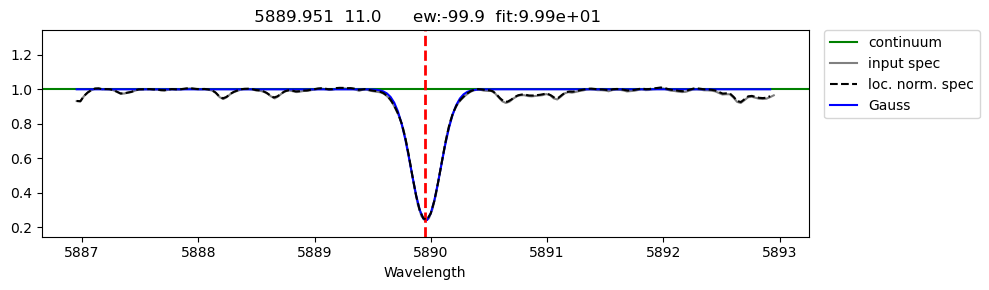

########################################
Writing to output file...

Moog entry:
   5889.951      11.0       0.0      0.12                        -99.90 9.990e+01 


#####
 5895.924 11.0
Points with flux values > 1.39 will be removed from continuum fit
0 point(s) removed
line 5895.924  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 208.28 fq = 0.000000 o-c: 0.001770
using an EW from Gauss
Line is too strong or too weak


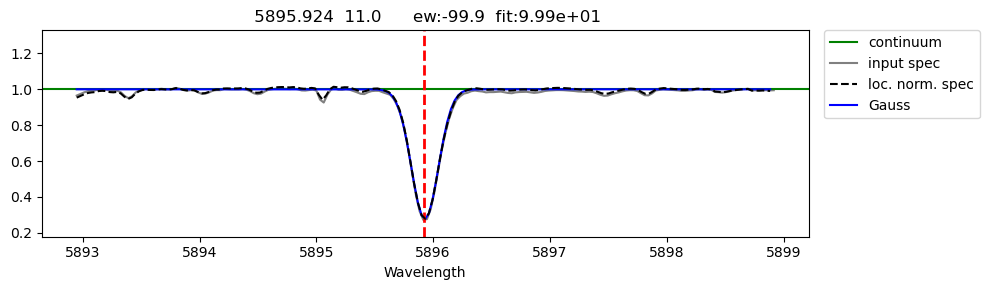

########################################
Writing to output file...

Moog entry:
   5895.924      11.0       0.0     -0.18                        -99.90 9.990e+01 


#####
 8183.255 11.0
Points with flux values > 1.38 will be removed from continuum fit
0 point(s) removed
line 8183.255  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 156.94 fq = 0.000000 o-c: 0.007115
using an EW from Gauss
Line is too strong or too weak


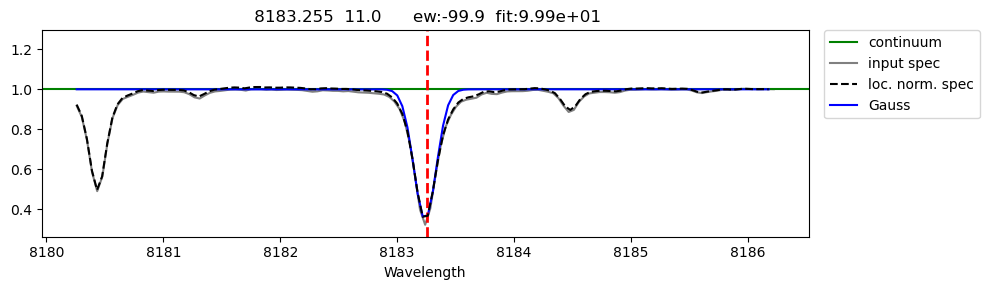

########################################
Writing to output file...

Moog entry:
   8183.255      11.0       2.1      0.23                        -99.90 9.990e+01 


#####
 5688.205 11.0
Points with flux values > 1.06 will be removed from continuum fit
0 point(s) removed
line 5688.205  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 65.26 fq = 2447.436505 o-c: 0.015043
using an EW from Gauss
5688.205 line outside the det_level range


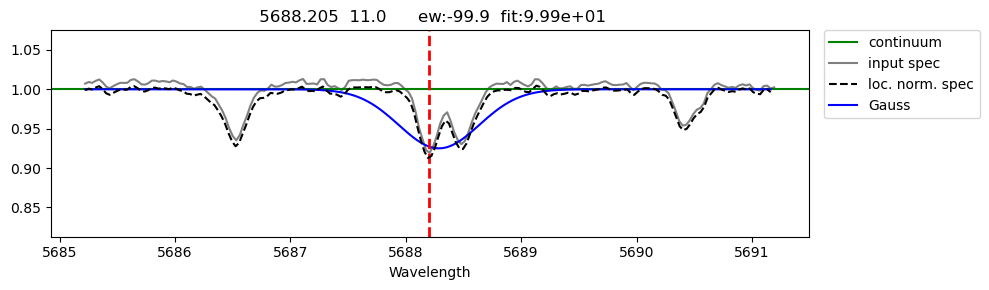

########################################
Writing to output file...

Moog entry:
   5688.205      11.0       2.1     -0.45                        -99.90 9.990e+01 


#####
 6154.226 11.0
Points with flux values > 1.04 will be removed from continuum fit
0 point(s) removed
I see this line at 6154.226 , but it is weak
I see 6 line(s) in this range
          Gauss : EW = 0.89 fq = 2801543386614169219490113004239852591382528.000000 o-c: 0.013812
using an EW from Gauss
Line is too strong or too weak


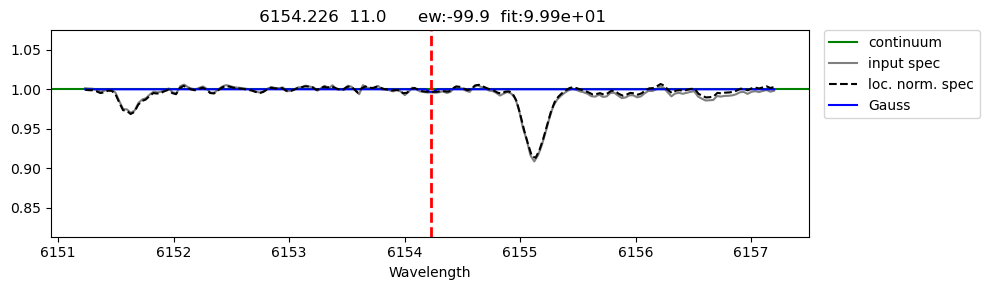

########################################
Writing to output file...

Moog entry:
   6154.226      11.0       2.1     -1.56                        -99.90 9.990e+01 


#####
 4571.096 12.0
Points with flux values > 1.38 will be removed from continuum fit
0 point(s) removed
line 4571.096  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 62.02 fq = 0.000000 o-c: 0.001865
using an EW from Gauss


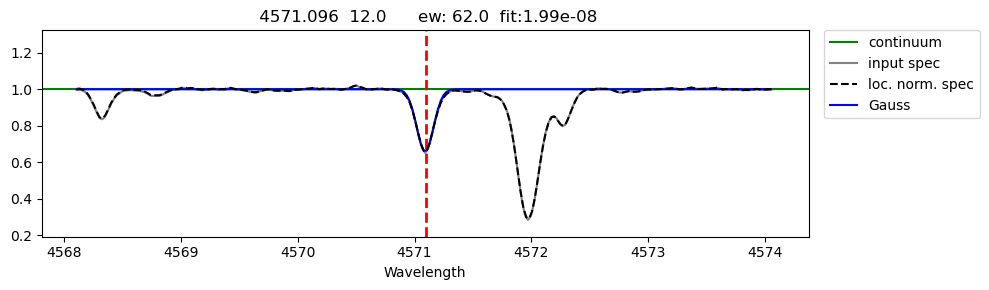

########################################
Writing to output file...

Moog entry:
   4571.096      12.0       0.0     -5.69                         62.02 1.988e-08 


#####
 5183.604 12.0
Points with flux values > 1.49 will be removed from continuum fit
0 point(s) removed
line 5183.604  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 308.66 fq = 0.000002 o-c: 0.003159
using an EW from Gauss
Line is too strong or too weak


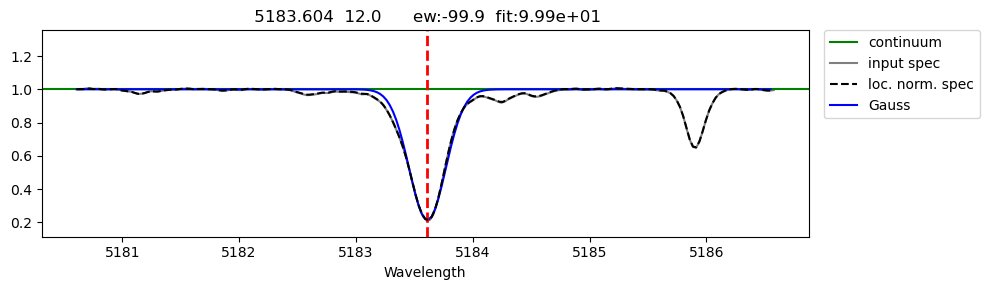

########################################
Writing to output file...

Moog entry:
   5183.604      12.0      2.71     -0.18                        -99.90 9.990e+01 


#####
 5172.684 12.0
Points with flux values > 1.48 will be removed from continuum fit
0 point(s) removed
line 5172.684  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 255.92 fq = 0.000000 o-c: 0.001389
using an EW from Gauss
Line is too strong or too weak


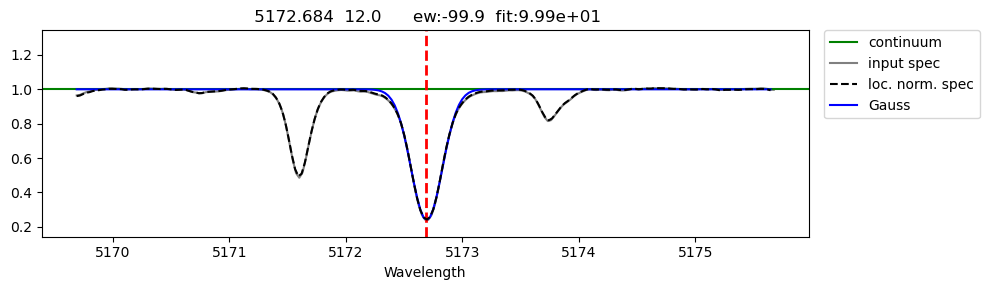

########################################
Writing to output file...

Moog entry:
   5172.684      12.0      2.71      -0.4                        -99.90 9.990e+01 


#####
 5528.405 12.0
Points with flux values > 1.28 will be removed from continuum fit
0 point(s) removed
line 5528.405  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 121.68 fq = 0.000000 o-c: 0.000253
using an EW from Gauss


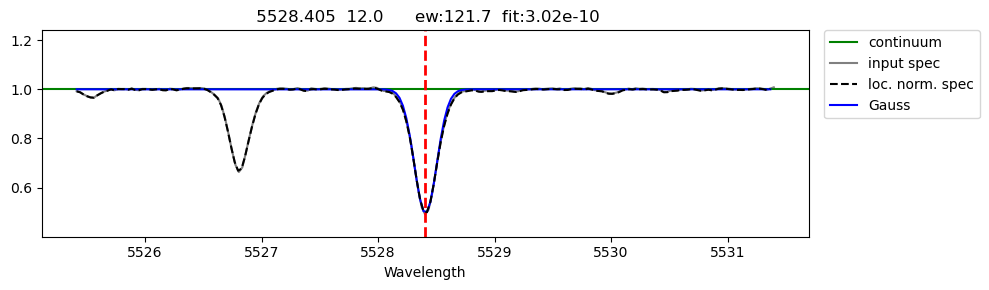

########################################
Writing to output file...

Moog entry:
   5528.405      12.0      4.34     -0.62                        121.68 3.025e-10 


#####
 4702.991 12.0
Points with flux values > 1.26 will be removed from continuum fit
0 point(s) removed
line 4702.991  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 118.89 fq = 0.000000 o-c: 0.001523
using an EW from Gauss


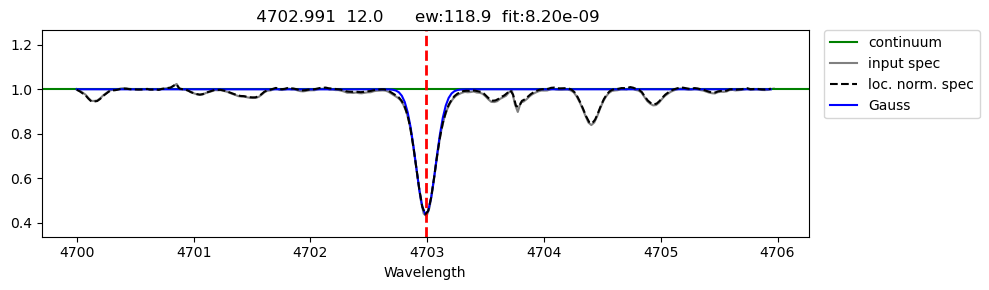

########################################
Writing to output file...

Moog entry:
   4702.991      12.0      4.34     -0.67                        118.89 8.197e-09 


#####
 4167.271 12.0
Points with flux values > 1.24 will be removed from continuum fit
0 point(s) removed
line 4167.271  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 99.62 fq = 0.000000 o-c: 0.003511
using an EW from Gauss


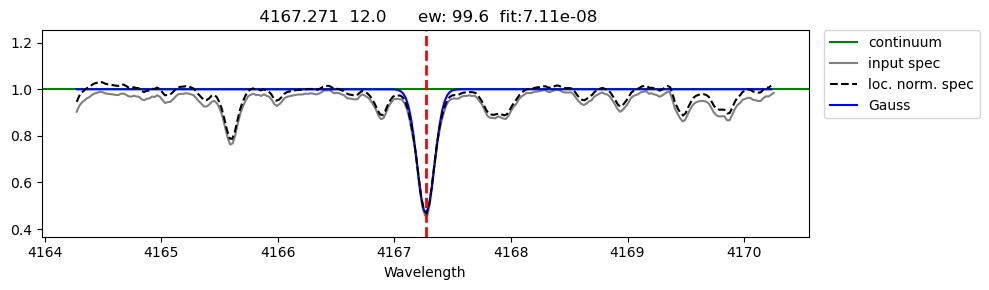

########################################
Writing to output file...

Moog entry:
   4167.271      12.0      4.34      -1.0                         99.62 7.108e-08 


#####
 4057.505 12.0
Points with flux values > 1.33 will be removed from continuum fit
0 point(s) removed
line 4057.505  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 100.18 fq = 0.000083 o-c: 0.018661
using an EW from Gauss


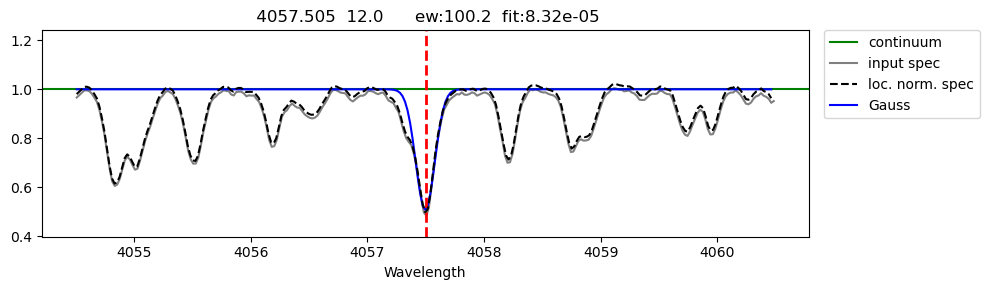

########################################
Writing to output file...

Moog entry:
   4057.505      12.0      4.34      -1.2                        100.18 8.317e-05 


#####
 5711.088 12.0
Points with flux values > 1.13 will be removed from continuum fit
0 point(s) removed
line 5711.088  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 34.55 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


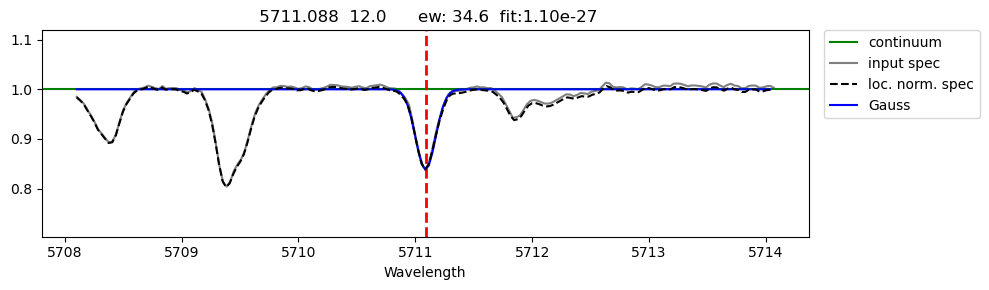

########################################
Writing to output file...

Moog entry:
   5711.088      12.0      4.34     -1.83                         34.55 1.103e-27 


#####
 3944.006 13.0
Points with flux values > 1.43 will be removed from continuum fit
0 point(s) removed
line 3944.006  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 166.10 fq = 0.000013 o-c: 0.012361
using an EW from Gauss
Line is too strong or too weak


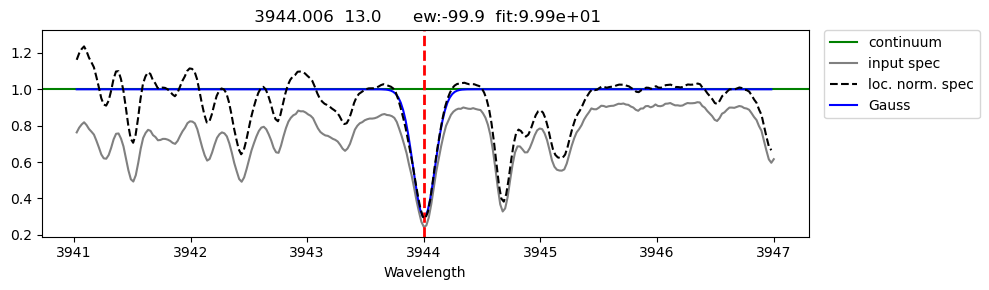

########################################
Writing to output file...

Moog entry:
   3944.006      13.0       0.0     -0.62                        -99.90 9.990e+01 


#####
 3961.52 13.0
Points with flux values > 1.38 will be removed from continuum fit
0 point(s) removed
line 3961.52  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 140.66 fq = 0.000000 o-c: 0.002500
using an EW from Gauss
Line is too strong or too weak


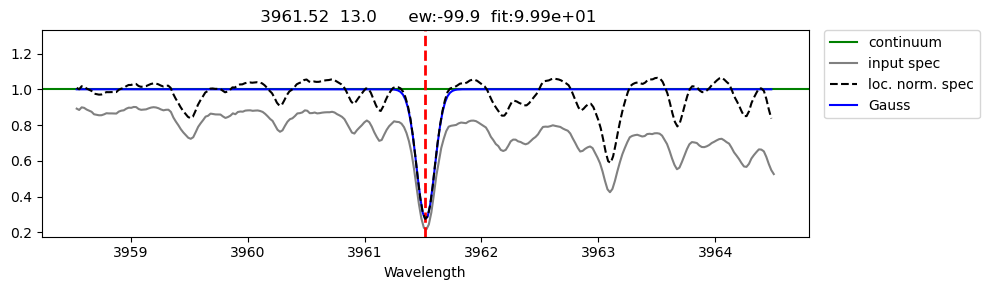

########################################
Writing to output file...

Moog entry:
    3961.52      13.0      0.01     -0.32                        -99.90 9.990e+01 


#####
 3905.523 14.0
Points with flux values > 1.59 will be removed from continuum fit
0 point(s) removed
line 3905.523  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 223.05 fq = 0.000005 o-c: 0.013530
using an EW from Gauss
Line is too strong or too weak


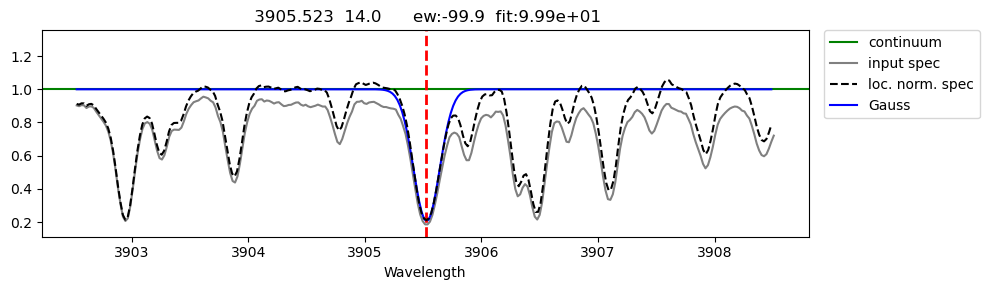

########################################
Writing to output file...

Moog entry:
   3905.523      14.0      1.91     -1.09                        -99.90 9.990e+01 


#####
 7664.911 19.0
Points with flux values > 1.61 will be removed from continuum fit
0 point(s) removed
line 7664.911  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 114.21 fq = 0.000000 o-c: 0.002267
using an EW from Gauss


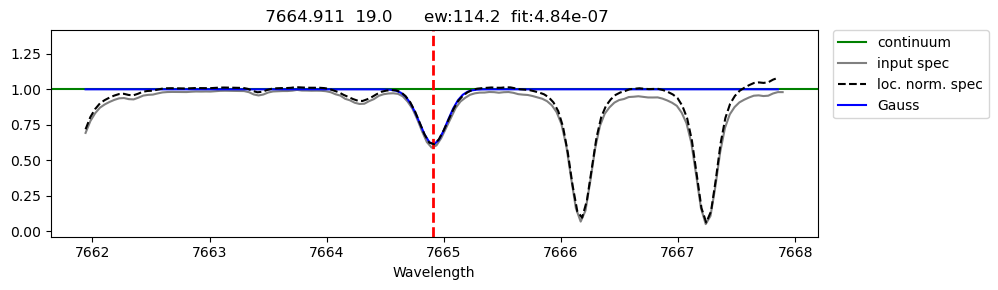

########################################
Writing to output file...

Moog entry:
   7664.911      19.0       0.0      0.13                        114.21 4.843e-07 


#####
 7698.974 19.0
Points with flux values > 1.18 will be removed from continuum fit
0 point(s) removed
line 7698.974  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 80.88 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


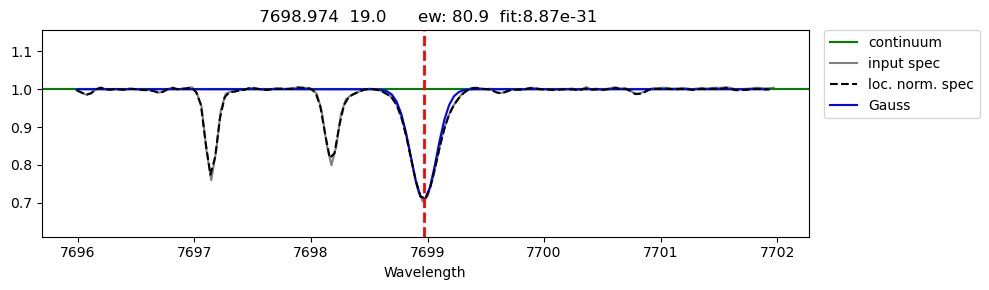

########################################
Writing to output file...

Moog entry:
   7698.974      19.0       0.0     -0.17                         80.88 8.871e-31 


#####
 6122.217 20.0
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 6122.217  was detected and it was classified as a strong line
I see 2 line(s) in this range
          Gauss : EW = 104.96 fq = 0.000000 o-c: 0.000272
using an EW from Gauss


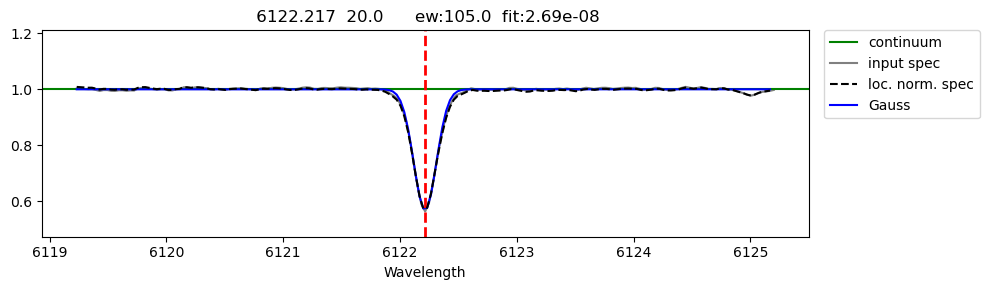

########################################
Writing to output file...

Moog entry:
   6122.217      20.0      1.88     -0.41                        104.96 2.687e-08 


#####
 6102.723 20.0
Points with flux values > 1.15 will be removed from continuum fit
0 point(s) removed
line 6102.723  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 67.41 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


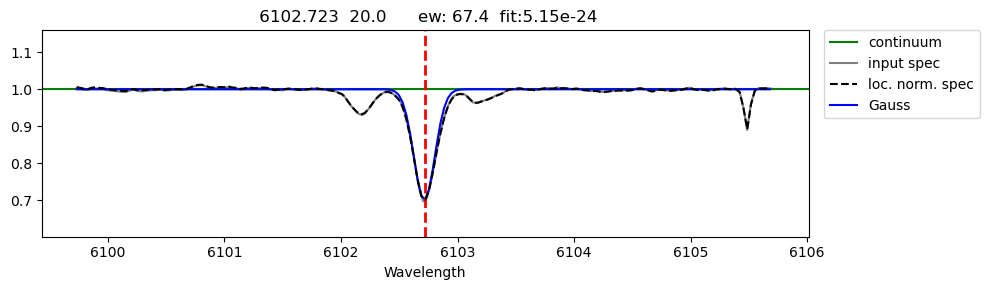

########################################
Writing to output file...

Moog entry:
   6102.723      20.0      1.88     -0.89                         67.41 5.151e-24 


#####
 6162.173 20.0
Points with flux values > 1.24 will be removed from continuum fit
0 point(s) removed
line 6162.173  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 114.74 fq = 0.000000 o-c: 0.000452
using an EW from Gauss


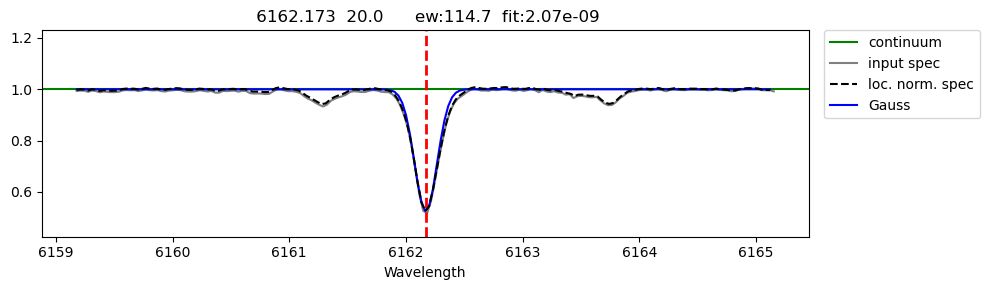

########################################
Writing to output file...

Moog entry:
   6162.173      20.0       1.9       0.1                        114.74 2.069e-09 


#####
 6169.563 20.0
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 6169.563  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 44.97 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


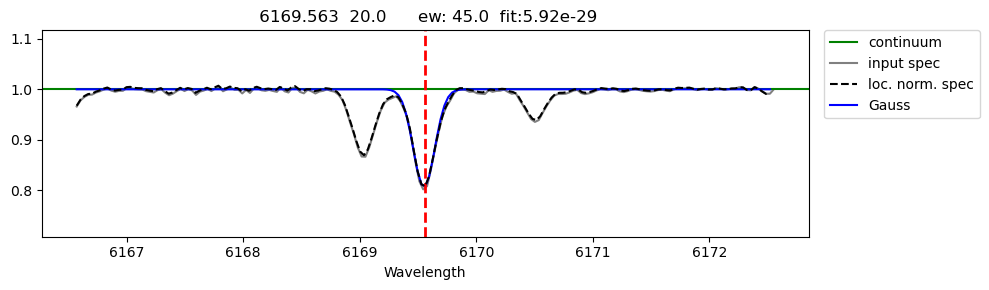

########################################
Writing to output file...

Moog entry:
   6169.563      20.0      2.52     -0.27                         44.97 5.924e-29 


#####
 6439.075 20.0
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 6439.075  was detected and it was classified as a strong line
I see 2 line(s) in this range
          Gauss : EW = 102.53 fq = 0.000000 o-c: 0.000411
using an EW from Gauss


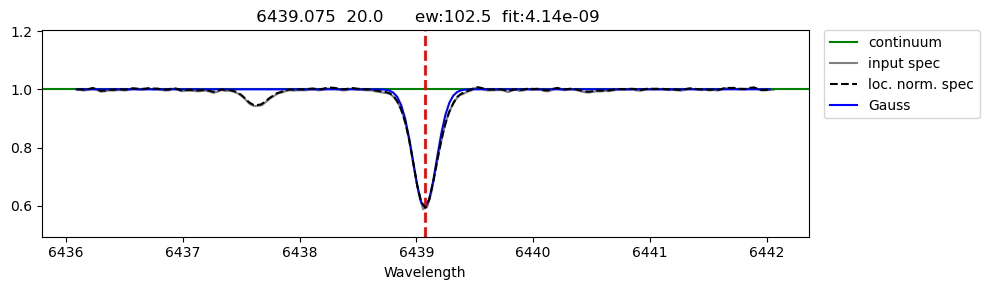

########################################
Writing to output file...

Moog entry:
   6439.075      20.0      2.52      0.47                        102.53 4.138e-09 


#####
 6169.042 20.0
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 6169.042  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 30.25 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


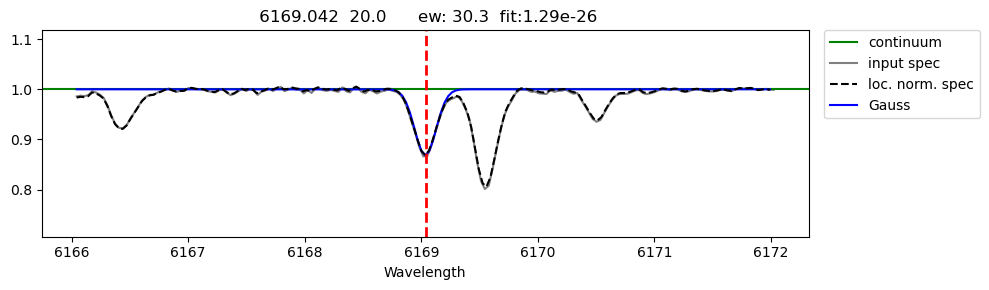

########################################
Writing to output file...

Moog entry:
   6169.042      20.0      2.52     -0.55                         30.25 1.291e-26 


#####
 6449.808 20.0
Points with flux values > 1.10 will be removed from continuum fit
0 point(s) removed
line 6449.808  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 47.03 fq = 0.001437 o-c: 0.008550
using an EW from Gauss


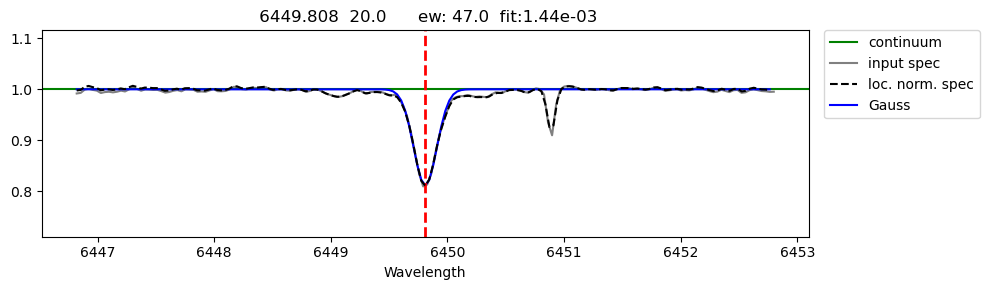

########################################
Writing to output file...

Moog entry:
   6449.808      20.0      2.52     -0.55                         47.03 1.437e-03 


#####
 6166.439 20.0
Points with flux values > 1.08 will be removed from continuum fit
0 point(s) removed
line 6166.439  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 19.04 fq = 316.161973 o-c: 0.021974
using an EW from Gauss
Line is too strong or too weak


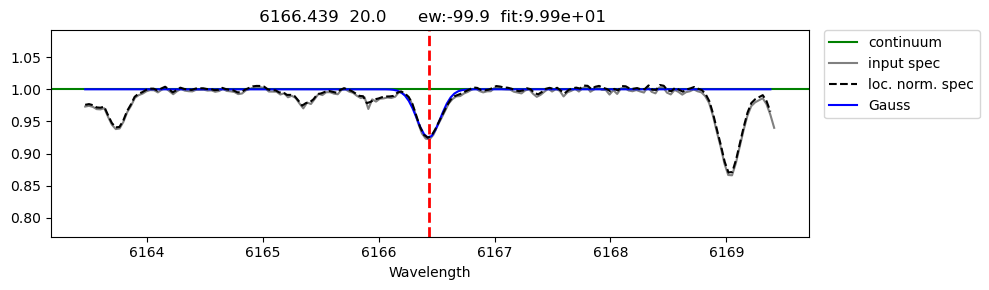

########################################
Writing to output file...

Moog entry:
   6166.439      20.0      2.52      -0.9                        -99.90 9.990e+01 


#####
 6161.297 20.0
Points with flux values > 1.24 will be removed from continuum fit
0 point(s) removed
line 6161.297  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 10.97 fq = 0.000000 o-c: 0.000099
using an EW from Gauss
Line is too strong or too weak


/arc5/local/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


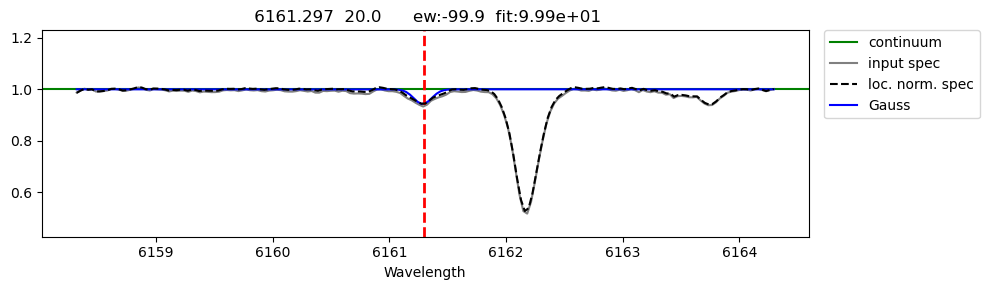

########################################
Writing to output file...

Moog entry:
   6161.297      20.0      2.52     -1.02                        -99.90 9.990e+01 


#####
 4246.822 21.1
Points with flux values > 1.44 will be removed from continuum fit
0 point(s) removed
line 4246.822  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 178.17 fq = 0.000000 o-c: 0.005838
using an EW from Gauss
Line is too strong or too weak


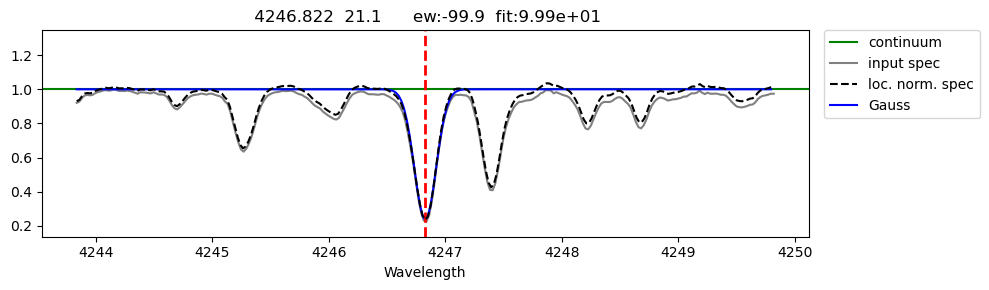

########################################
Writing to output file...

Moog entry:
   4246.822      21.1      0.32      0.32                        -99.90 9.990e+01 


#####
 4324.996 21.1
Points with flux values > 1.46 will be removed from continuum fit
0 point(s) removed
line 4324.996  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 116.14 fq = 0.000002 o-c: 0.008320
using an EW from Gauss


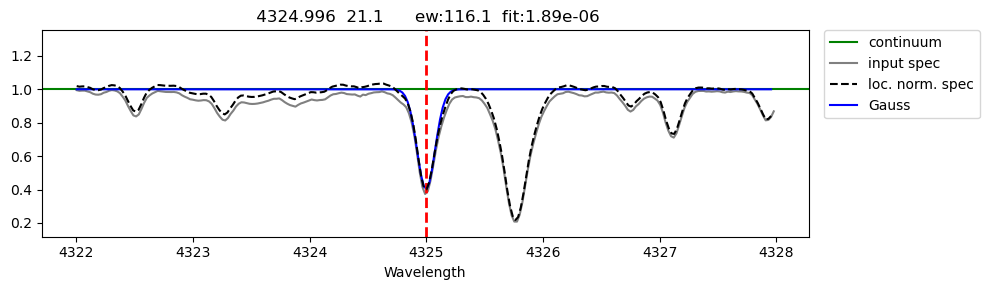

########################################
Writing to output file...

Moog entry:
   4324.996      21.1      0.59     -0.44                        116.14 1.895e-06 


#####
 4415.557 21.1
Points with flux values > 1.51 will be removed from continuum fit
0 point(s) removed
line 4415.557  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 98.39 fq = 0.000000 o-c: 0.010307
using an EW from Gauss


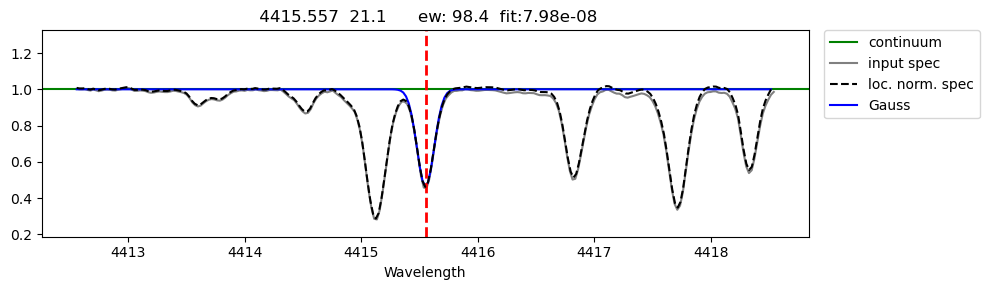

########################################
Writing to output file...

Moog entry:
   4415.557      21.1      0.59     -0.64                         98.39 7.981e-08 


#####
 4320.732 21.1
Points with flux values > 1.41 will be removed from continuum fit
0 point(s) removed
line 4320.732  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 134.26 fq = 0.000037 o-c: 0.009961
using an EW from Gauss


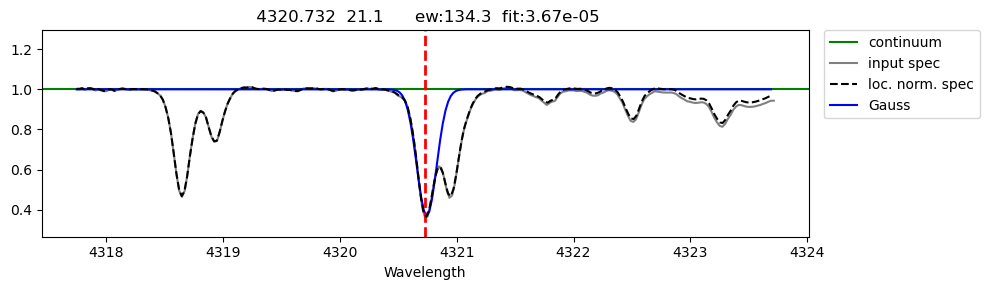

########################################
Writing to output file...

Moog entry:
   4320.732      21.1       0.6     -0.26                        134.26 3.675e-05 


#####
 4400.389 21.1
Points with flux values > 1.40 will be removed from continuum fit
0 point(s) removed
line 4400.389  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 104.53 fq = 0.000000 o-c: 0.003663
using an EW from Gauss


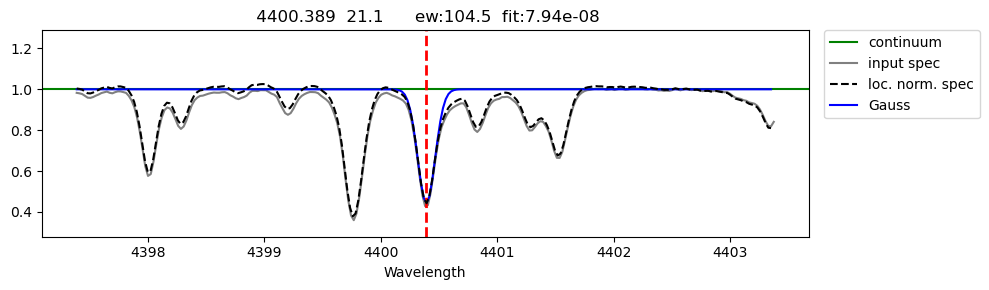

########################################
Writing to output file...

Moog entry:
   4400.389      21.1       0.6     -0.51                        104.53 7.944e-08 


#####
 4314.083 21.1
Points with flux values > 1.53 will be removed from continuum fit
0 point(s) removed
line 4314.083  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 143.63 fq = 0.000385 o-c: 0.031338
using an EW from Gauss
Line is too strong or too weak


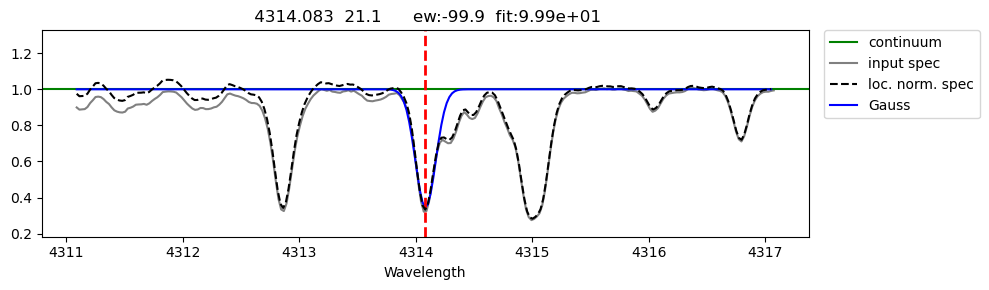

########################################
Writing to output file...

Moog entry:
   4314.083      21.1      0.62      -0.1                        -99.90 9.990e+01 


#####
 4374.457 21.1
Points with flux values > 1.46 will be removed from continuum fit
0 point(s) removed
line 4374.457  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 110.51 fq = 0.000003 o-c: 0.022829
using an EW from Gauss


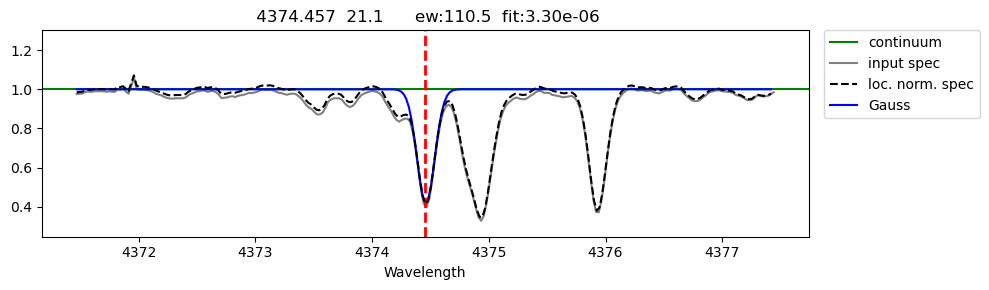

########################################
Writing to output file...

Moog entry:
   4374.457      21.1      0.62     -0.44                        110.51 3.302e-06 


#####
 4002.936 23.1
Points with flux values > 1.45 will be removed from continuum fit
0 point(s) removed
line 4002.936  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 34.09 fq = 0.000000 o-c: 0.005681
using an EW from Gauss


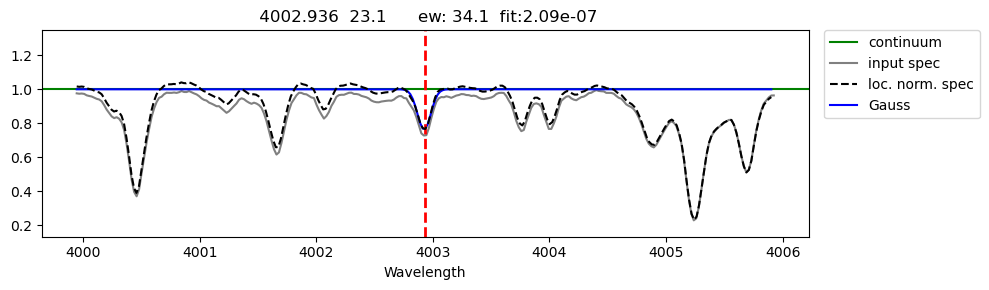

########################################
Writing to output file...

Moog entry:
   4002.936      23.1      1.43     -1.81                         34.09 2.087e-07 


#####
 4023.377 23.1
Points with flux values > 1.41 will be removed from continuum fit
0 point(s) removed
line 4023.377  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 58.80 fq = 0.000132 o-c: 0.024185
using an EW from Gauss


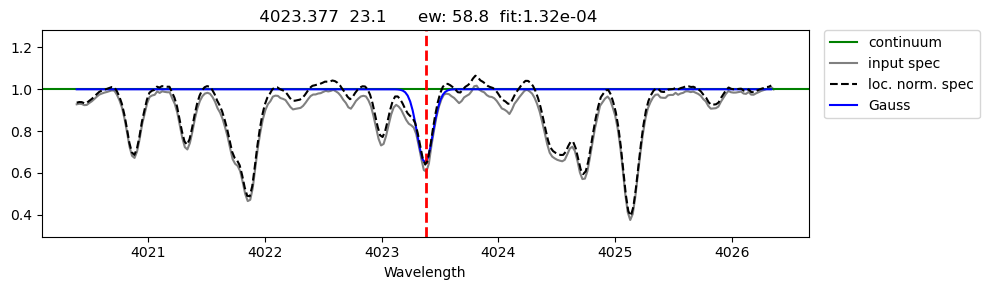

########################################
Writing to output file...

Moog entry:
   4023.377      23.1       1.8     -0.61                         58.80 1.318e-04 


#####
 4005.706 23.1
Points with flux values > 1.41 will be removed from continuum fit
0 point(s) removed
line 4005.706  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 82.78 fq = 0.000022 o-c: 0.019381
using an EW from Gauss


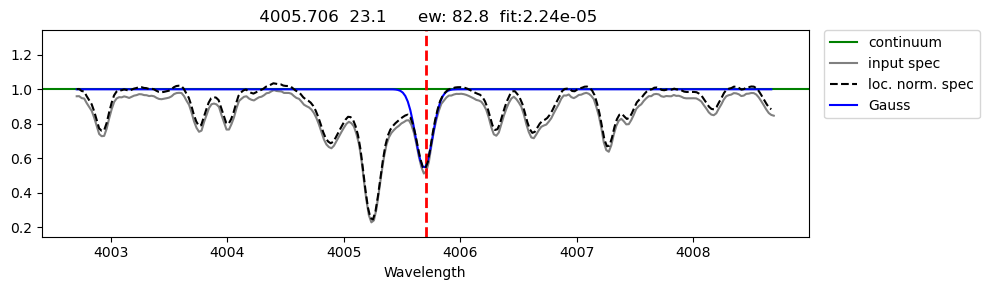

########################################
Writing to output file...

Moog entry:
   4005.706      23.1      1.82     -0.46                         82.78 2.241e-05 


#####
 4254.352 24.0
Points with flux values > 1.34 will be removed from continuum fit
0 point(s) removed
line 4254.352  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 136.01 fq = 0.000000 o-c: 0.001065
using an EW from Gauss


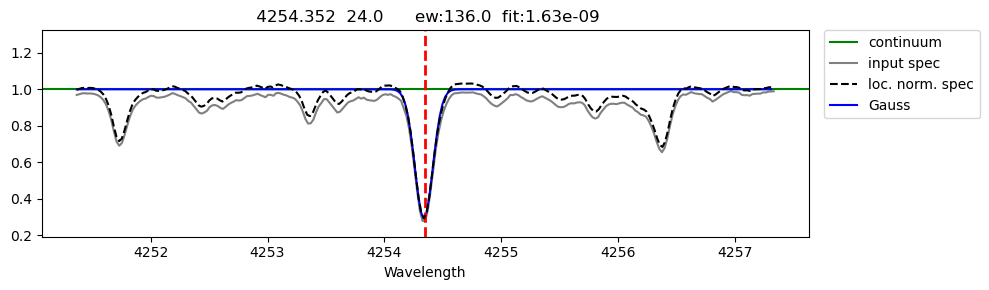

########################################
Writing to output file...

Moog entry:
   4254.352      24.0       0.0     -0.09                        136.01 1.632e-09 


#####
 4274.812 24.0
Points with flux values > 1.37 will be removed from continuum fit
0 point(s) removed
line 4274.812  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 132.99 fq = 0.000000 o-c: 0.004840
using an EW from Gauss


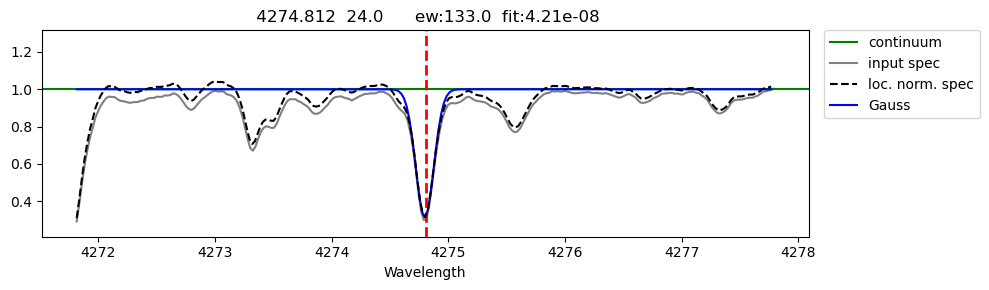

########################################
Writing to output file...

Moog entry:
   4274.812      24.0       0.0     -0.22                        132.99 4.213e-08 


#####
 4289.731 24.0
Points with flux values > 1.49 will be removed from continuum fit
0 point(s) removed
line 4289.731  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 131.17 fq = 0.000233 o-c: 0.030324
using an EW from Gauss


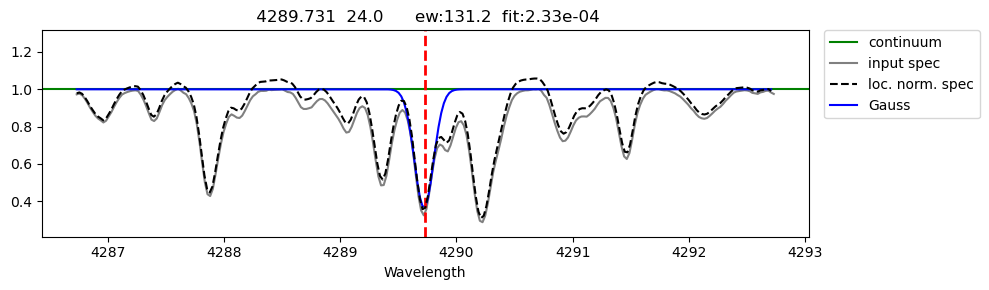

########################################
Writing to output file...

Moog entry:
   4289.731      24.0       0.0     -0.37                        131.17 2.327e-04 


#####
 5206.023 24.0
Points with flux values > 1.44 will be removed from continuum fit
0 point(s) removed
line 5206.023  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 112.04 fq = 0.000002 o-c: 0.012286
using an EW from Gauss


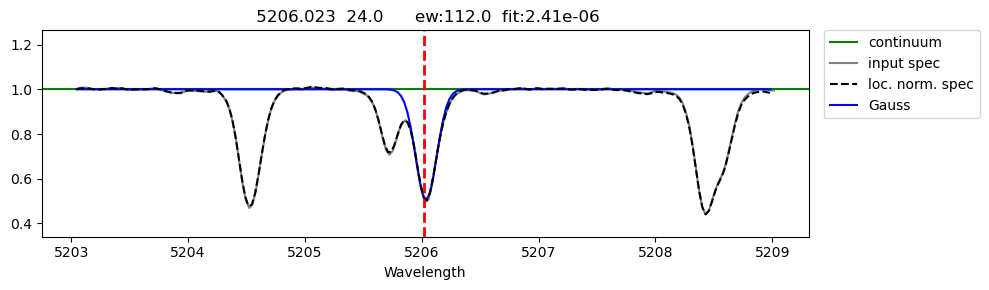

########################################
Writing to output file...

Moog entry:
   5206.023      24.0      0.94      0.02                        112.04 2.408e-06 


#####
 5208.409 24.0
Points with flux values > 1.39 will be removed from continuum fit
0 point(s) removed
line 5208.409  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 137.19 fq = 0.000004 o-c: 0.003207
using an EW from Gauss


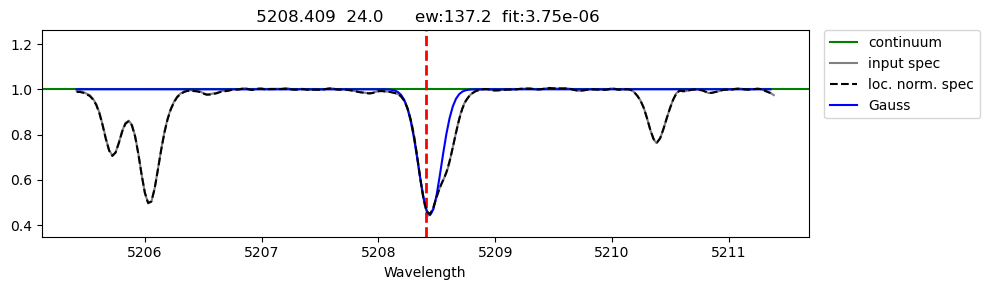

########################################
Writing to output file...

Moog entry:
   5208.409      24.0      0.94      0.17                        137.19 3.752e-06 


#####
 4545.953 24.0
Points with flux values > 1.22 will be removed from continuum fit
0 point(s) removed
line 4545.953  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 27.95 fq = 0.000000 o-c: 0.000215
using an EW from Gauss


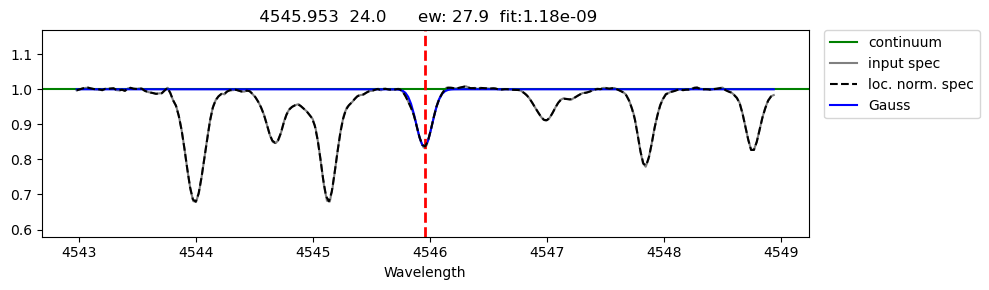

########################################
Writing to output file...

Moog entry:
   4545.953      24.0      0.94     -1.37                         27.95 1.184e-09 


#####
 4626.173 24.0
Points with flux values > 1.14 will be removed from continuum fit
0 point(s) removed
line 4626.173  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 25.74 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


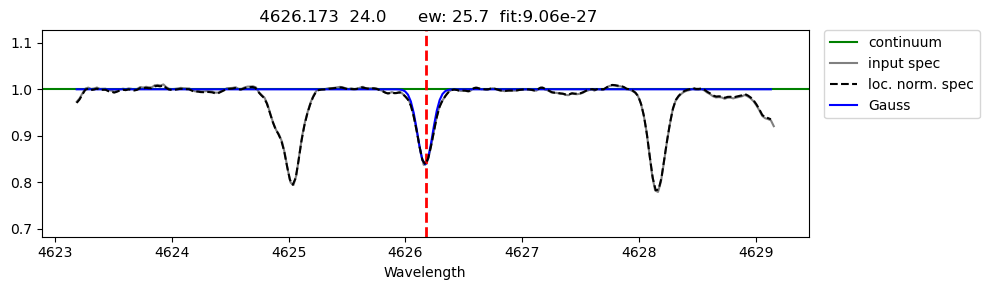

########################################
Writing to output file...

Moog entry:
   4626.173      24.0      0.97     -1.33                         25.74 9.063e-27 


#####
 5298.272 24.0
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 5298.272  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 40.22 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


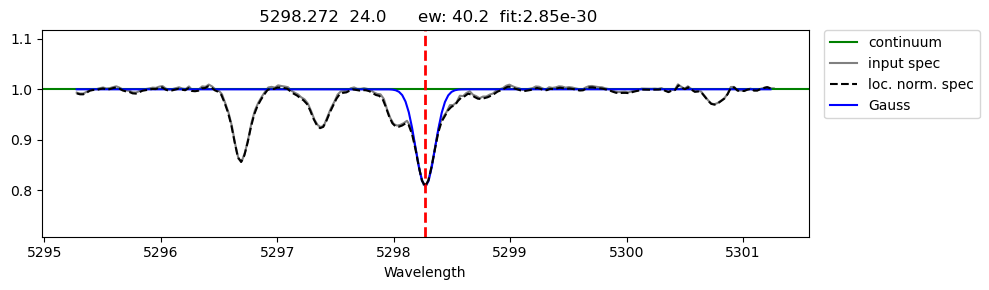

########################################
Writing to output file...

Moog entry:
   5298.272      24.0      0.98     -1.14                         40.22 2.854e-30 


#####
 4616.124 24.0
Points with flux values > 1.17 will be removed from continuum fit
0 point(s) removed
line 4616.124  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 34.03 fq = 0.000000 o-c: 0.000533
using an EW from Gauss


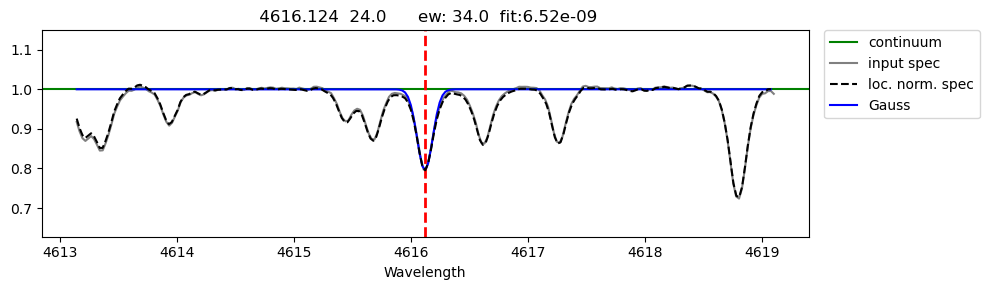

########################################
Writing to output file...

Moog entry:
   4616.124      24.0      0.98     -1.19                         34.03 6.516e-09 


#####
 5296.691 24.0
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 5296.691  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 25.85 fq = 33.369048 o-c: 0.032064
using an EW from Gauss


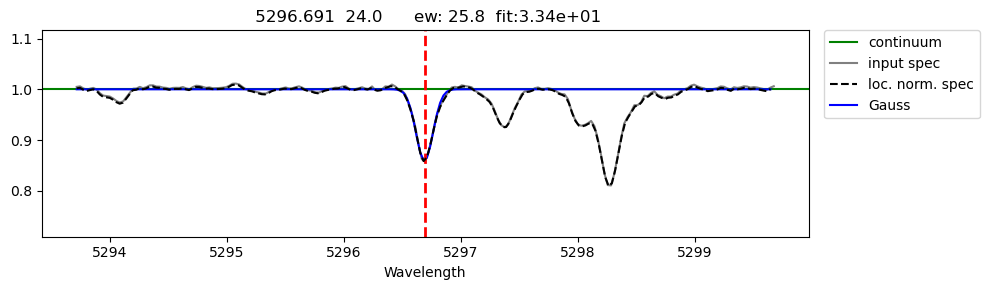

########################################
Writing to output file...

Moog entry:
   5296.691      24.0      0.98     -1.36                         25.85 3.337e+01 


#####
 4651.291 24.0
Points with flux values > 1.13 will be removed from continuum fit
0 point(s) removed
line 4651.291  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 20.40 fq = 0.000000 o-c: 0.000036
using an EW from Gauss


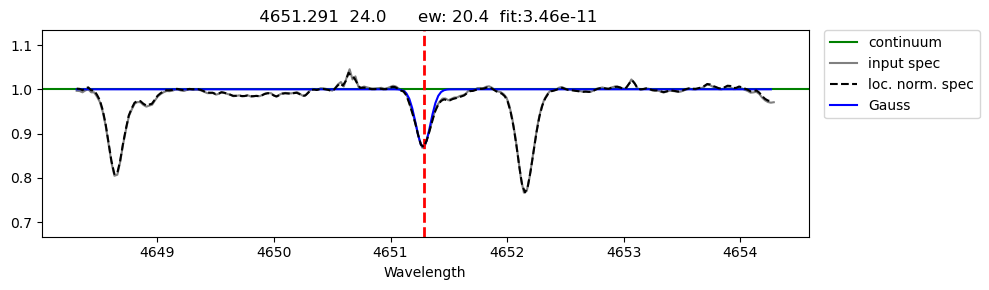

########################################
Writing to output file...

Moog entry:
   4651.291      24.0      0.98     -1.46                         20.40 3.459e-11 


#####
 5300.745 24.0
Points with flux values > 1.16 will be removed from continuum fit
0 point(s) removed
line 5300.745  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 5.33 fq = 0.000000 o-c: 0.000025
using an EW from Gauss
Line is too strong or too weak


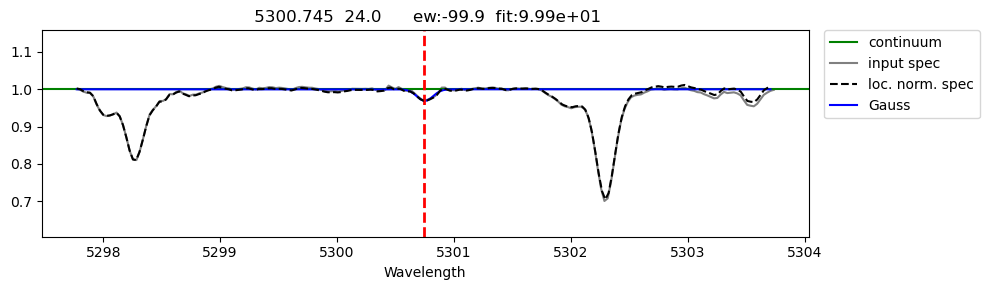

########################################
Writing to output file...

Moog entry:
   5300.745      24.0      0.98      -2.0                        -99.90 9.990e+01 


#####
 5345.796 24.0
Points with flux values > 1.12 will be removed from continuum fit
0 point(s) removed
line 5345.796  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 48.99 fq = 0.179859 o-c: 0.022814
using an EW from Gauss


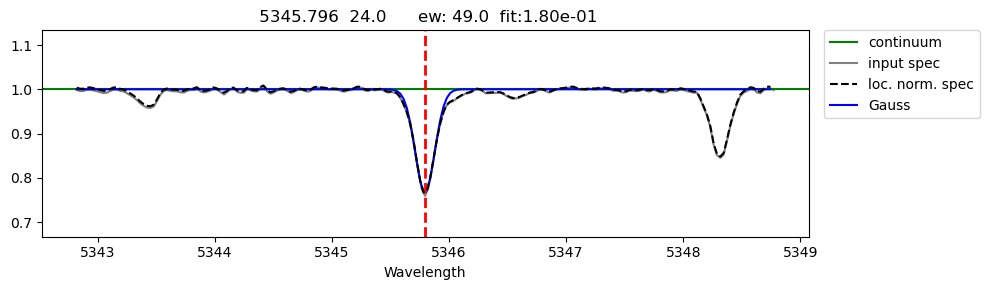

########################################
Writing to output file...

Moog entry:
   5345.796      24.0       1.0     -0.95                         48.99 1.799e-01 


#####
 4652.157 24.0
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 4652.157  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 39.47 fq = 0.000000 o-c: 0.000402
using an EW from Gauss


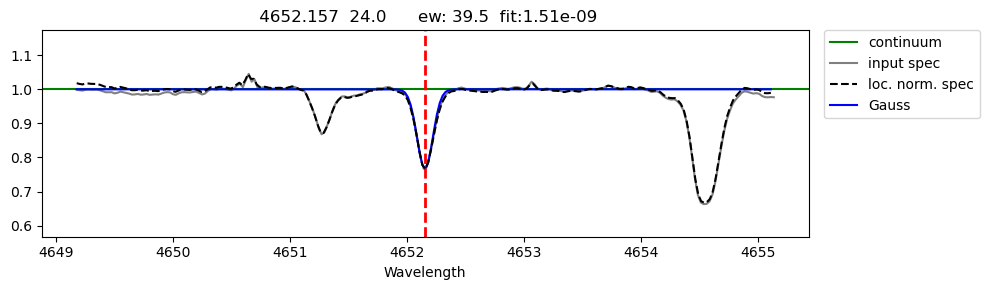

########################################
Writing to output file...

Moog entry:
   4652.157      24.0       1.0     -1.04                         39.47 1.510e-09 


#####
 3908.756 24.0
Points with flux values > 1.47 will be removed from continuum fit
0 point(s) removed
line 3908.756  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 25.61 fq = 0.000000 o-c: 0.007308
using an EW from Gauss


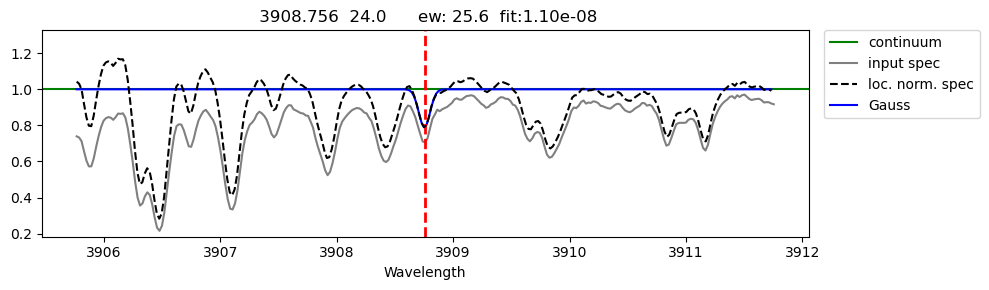

########################################
Writing to output file...

Moog entry:
   3908.756      24.0       1.0     -1.05                         25.61 1.103e-08 


#####
 5348.314 24.0
Points with flux values > 1.15 will be removed from continuum fit
0 point(s) removed
line 5348.314  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 29.79 fq = 0.000000 o-c: 0.000337
using an EW from Gauss


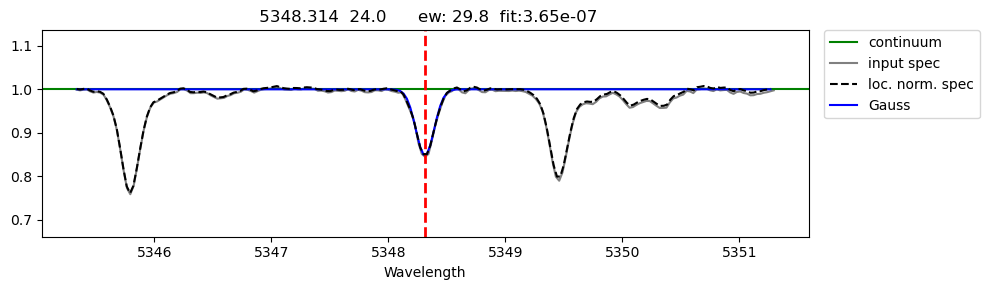

########################################
Writing to output file...

Moog entry:
   5348.314      24.0       1.0     -1.21                         29.79 3.651e-07 


#####
 4600.749 24.0
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 4600.749  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 28.33 fq = 0.000000 o-c: 0.000804
using an EW from Gauss


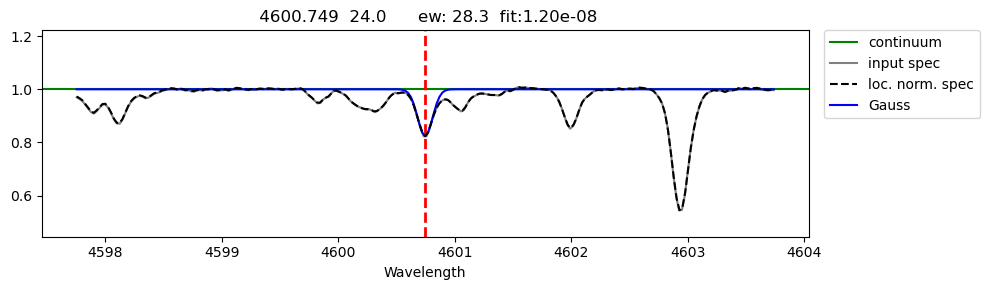

########################################
Writing to output file...

Moog entry:
   4600.749      24.0       1.0     -1.25                         28.33 1.195e-08 


#####
 5409.783 24.0
Points with flux values > 1.18 will be removed from continuum fit
0 point(s) removed
line 5409.783  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 60.41 fq = 0.000000 o-c: 0.000104
using an EW from Gauss


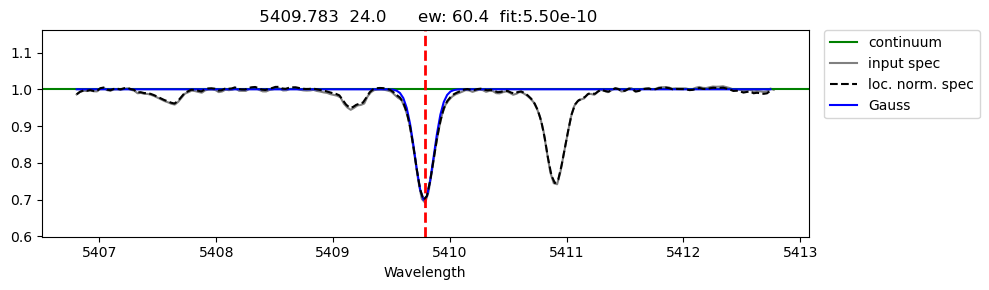

########################################
Writing to output file...

Moog entry:
   5409.783      24.0      1.03     -0.67                         60.41 5.495e-10 


#####
 4646.162 24.0
Points with flux values > 1.18 will be removed from continuum fit
0 point(s) removed
line 4646.162  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 50.53 fq = 0.000000 o-c: 0.000035
using an EW from Gauss


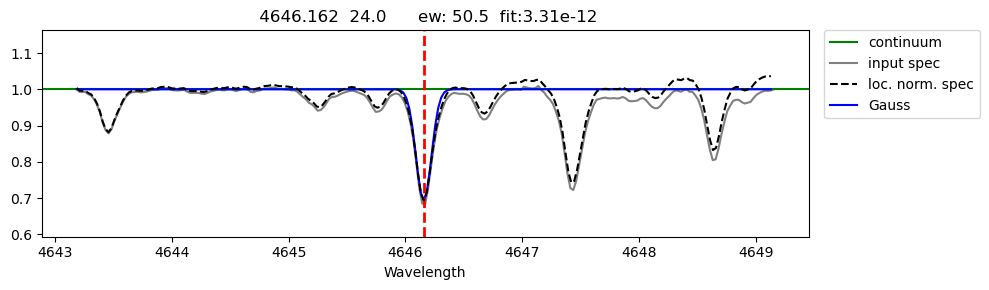

########################################
Writing to output file...

Moog entry:
   4646.162      24.0      1.03     -0.74                         50.53 3.306e-12 


#####
 4030.753 25.0
Points with flux values > 1.55 will be removed from continuum fit
0 point(s) removed
line 4030.753  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 170.50 fq = 0.001071 o-c: 0.056940
using an EW from Gauss
Line is too strong or too weak


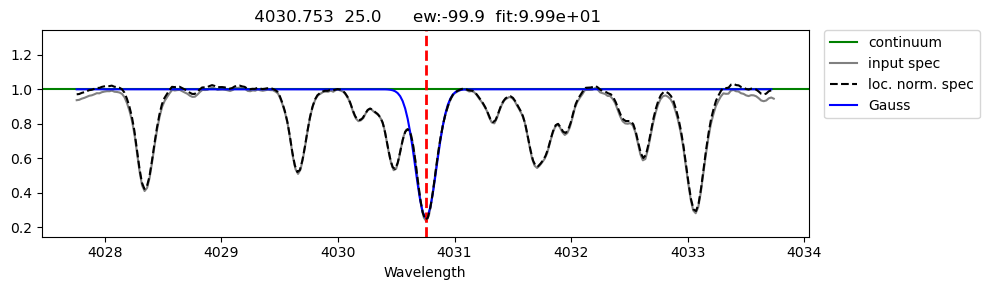

########################################
Writing to output file...

Moog entry:
   4030.753      25.0       0.0     -0.47                        -99.90 9.990e+01 


#####
 4033.062 25.0
Points with flux values > 1.54 will be removed from continuum fit
0 point(s) removed
line 4033.062  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 137.02 fq = 0.000000 o-c: 0.004756
using an EW from Gauss


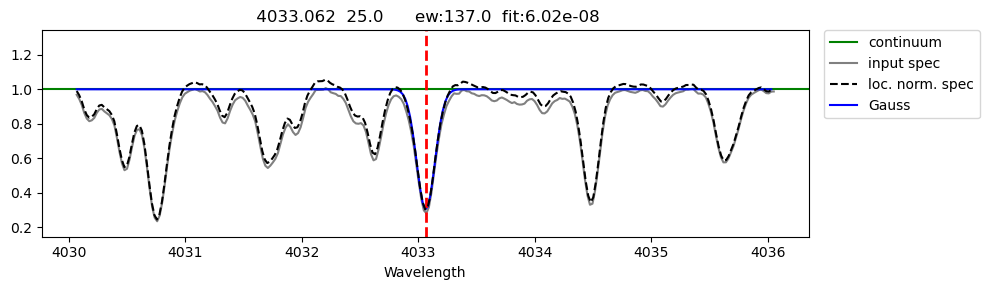

########################################
Writing to output file...

Moog entry:
   4033.062      25.0       0.0     -0.62                        137.02 6.025e-08 


#####
 4034.483 25.0
Points with flux values > 1.47 will be removed from continuum fit
0 point(s) removed
line 4034.483  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 114.71 fq = 0.000000 o-c: 0.004855
using an EW from Gauss


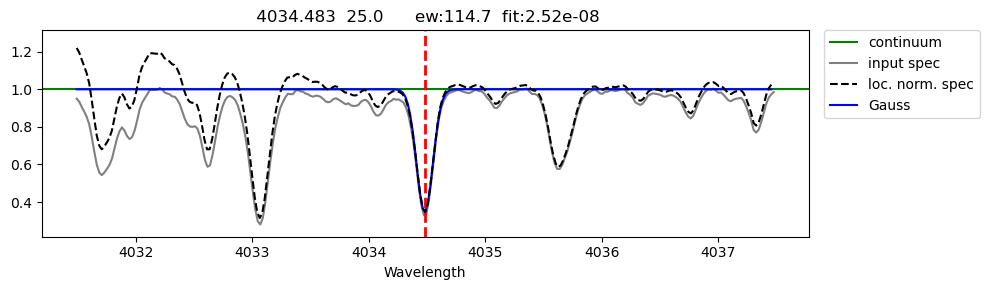

########################################
Writing to output file...

Moog entry:
   4034.483      25.0       0.0     -0.81                        114.71 2.518e-08 


#####
 5476.904 28.0
Points with flux values > 1.23 will be removed from continuum fit
0 point(s) removed
line 5476.904  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 93.49 fq = 0.000000 o-c: 0.000755
using an EW from Gauss


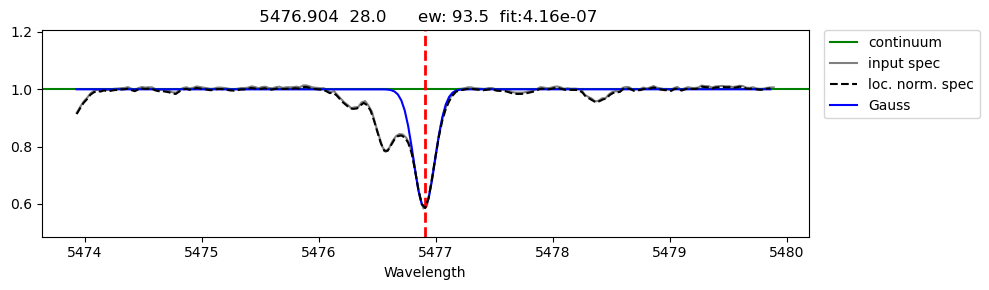

########################################
Writing to output file...

Moog entry:
   5476.904      28.0      1.82     -0.78                         93.49 4.156e-07 


#####
 4648.652 28.0
Points with flux values > 1.19 will be removed from continuum fit
0 point(s) removed
line 4648.652  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 26.88 fq = 0.000000 o-c: 0.000233
using an EW from Gauss


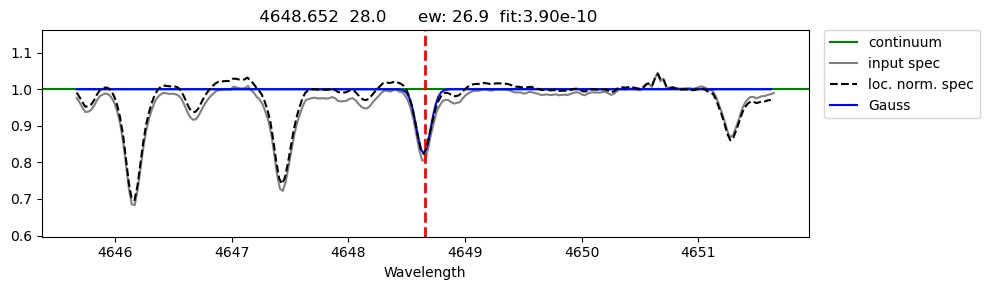

########################################
Writing to output file...

Moog entry:
   4648.652      28.0      3.42     -0.09                         26.88 3.898e-10 


#####
 4604.988 28.0
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 4604.988  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 22.63 fq = 0.000000 o-c: 0.000106
using an EW from Gauss


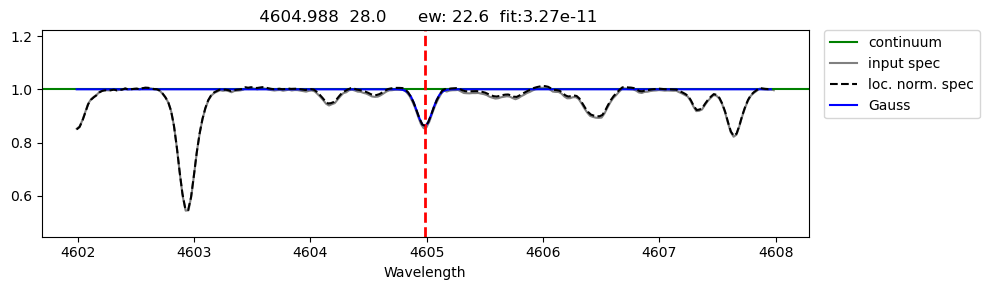

########################################
Writing to output file...

Moog entry:
   4604.988      28.0      3.48     -0.24                         22.63 3.273e-11 


#####
 4756.515 28.0
Points with flux values > 1.10 will be removed from continuum fit
0 point(s) removed
line 4756.515  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 22.29 fq = 42.023690 o-c: 0.028588
using an EW from Gauss


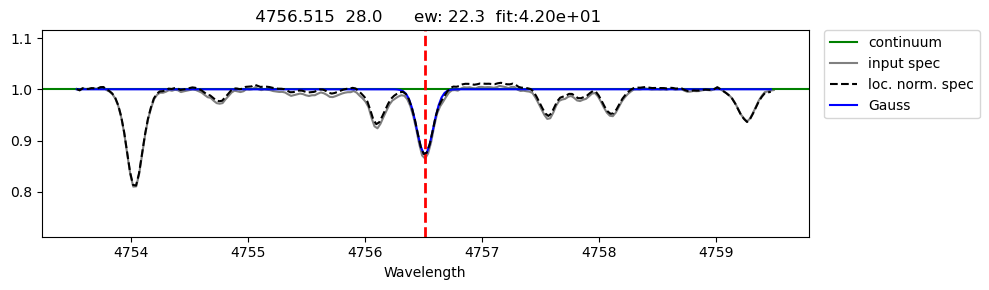

########################################
Writing to output file...

Moog entry:
   4756.515      28.0      3.48     -0.27                         22.29 4.202e+01 


#####
 5017.576 28.0
Points with flux values > 1.37 will be removed from continuum fit
0 point(s) removed
line 5017.576  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 28.02 fq = 0.000000 o-c: 0.001296
using an EW from Gauss


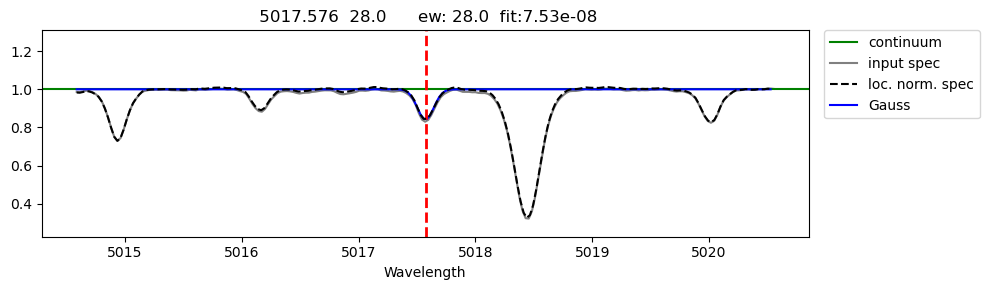

########################################
Writing to output file...

Moog entry:
   5017.576      28.0      3.54     -0.03                         28.02 7.528e-08 


#####
 4904.407 28.0
Points with flux values > 1.18 will be removed from continuum fit
0 point(s) removed
line 4904.407  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 27.56 fq = 0.000000 o-c: 0.000288
using an EW from Gauss


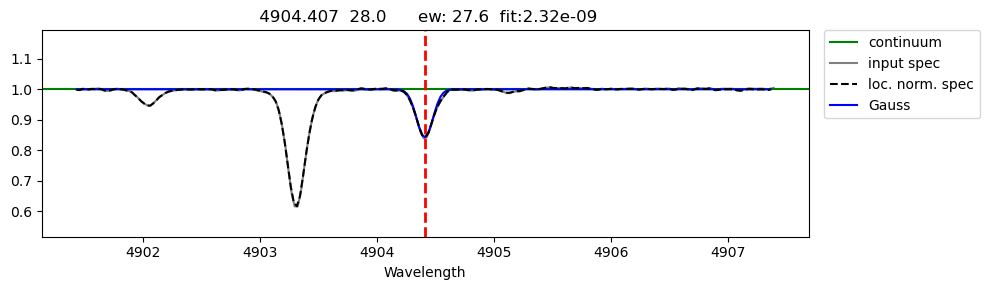

########################################
Writing to output file...

Moog entry:
   4904.407      28.0      3.54     -0.17                         27.56 2.324e-09 


#####
 4980.173 28.0
Points with flux values > 1.22 will be removed from continuum fit
0 point(s) removed
line 4980.173  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 32.19 fq = 0.000000 o-c: 0.000244
using an EW from Gauss


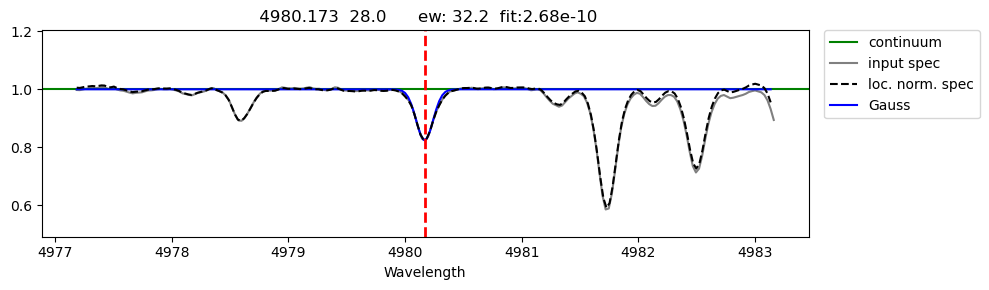

########################################
Writing to output file...

Moog entry:
   4980.173      28.0       3.6      0.07                         32.19 2.681e-10 


#####
 5080.533 28.0
Points with flux values > 1.26 will be removed from continuum fit
0 point(s) removed
line 5080.533  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 42.70 fq = 0.000000 o-c: 0.001404
using an EW from Gauss


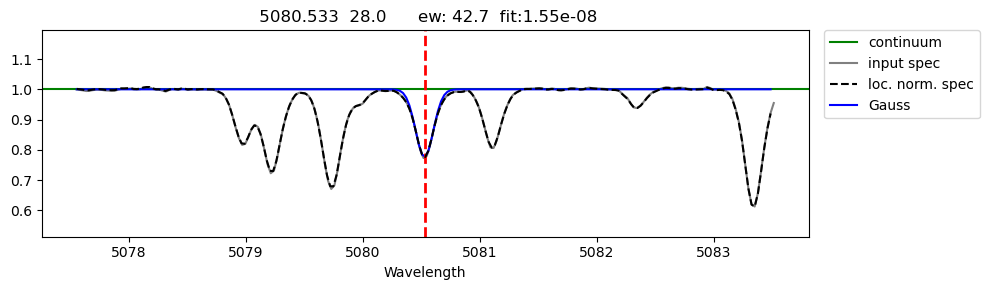

########################################
Writing to output file...

Moog entry:
   5080.533      28.0      3.65      0.32                         42.70 1.550e-08 


#####
 5084.089 28.0
Points with flux values > 1.19 will be removed from continuum fit
0 point(s) removed
line 5084.089  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 28.79 fq = 0.000000 o-c: 0.000307
using an EW from Gauss


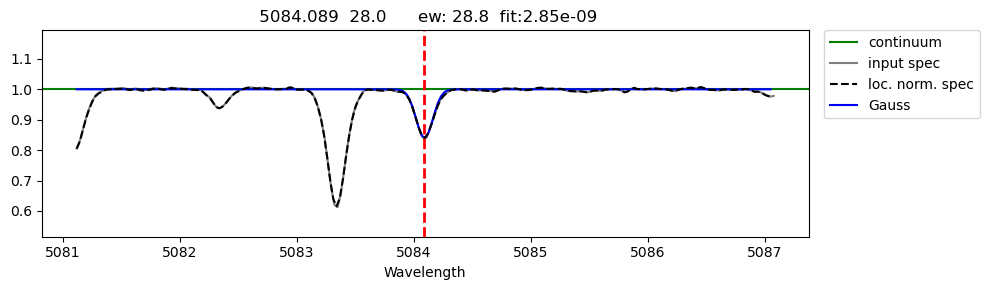

########################################
Writing to output file...

Moog entry:
   5084.089      28.0      3.68      0.03                         28.79 2.852e-09 


#####
 5081.107 28.0
Points with flux values > 1.26 will be removed from continuum fit
0 point(s) removed
line 5081.107  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 34.87 fq = 0.000000 o-c: 0.001351
using an EW from Gauss


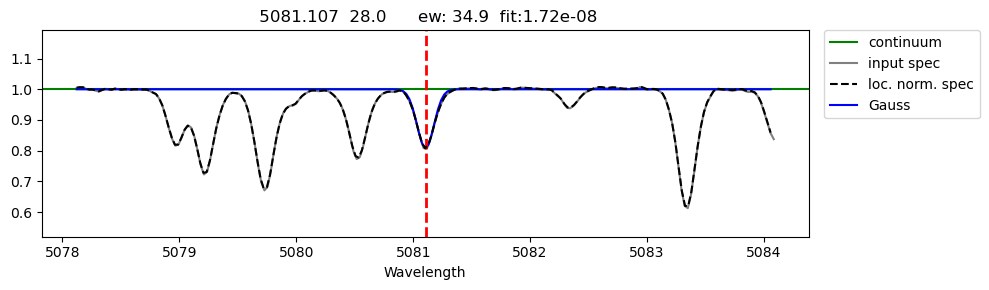

########################################
Writing to output file...

Moog entry:
   5081.107      28.0      3.84       0.3                         34.87 1.723e-08 


#####
 5105.537 29.0
Points with flux values > 1.25 will be removed from continuum fit
0 point(s) removed
line 5105.537  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 7.59 fq = 0.000000 o-c: 0.000369
using an EW from Gauss
Line is too strong or too weak


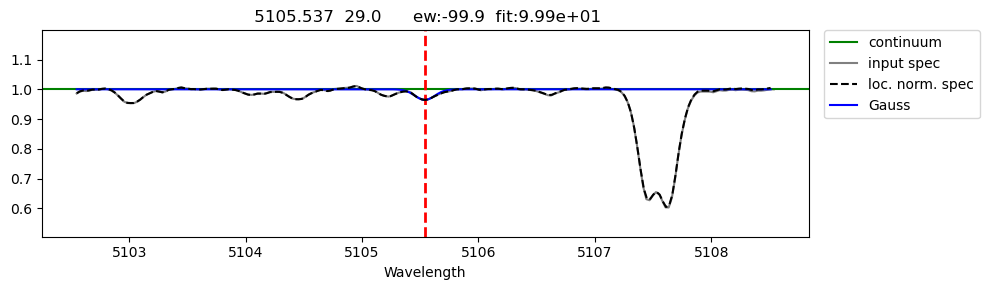

########################################
Writing to output file...

Moog entry:
   5105.537      29.0      1.39     -1.52                        -99.90 9.990e+01 


#####
 4722.15 30.0
Points with flux values > 1.09 will be removed from continuum fit
0 point(s) removed
line 4722.15  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 33.07 fq = 0.033362 o-c: 0.018475
using an EW from Gauss


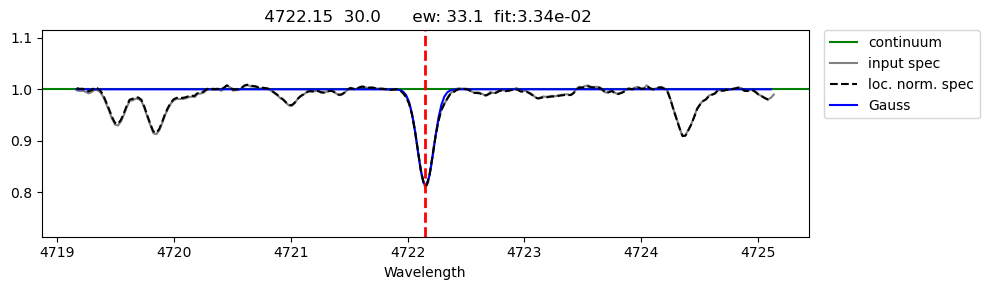

########################################
Writing to output file...

Moog entry:
    4722.15      30.0      4.03     -0.37                         33.07 3.336e-02 


#####
 4810.53 30.0
Points with flux values > 1.12 will be removed from continuum fit
0 point(s) removed
line 4810.53  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 41.04 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


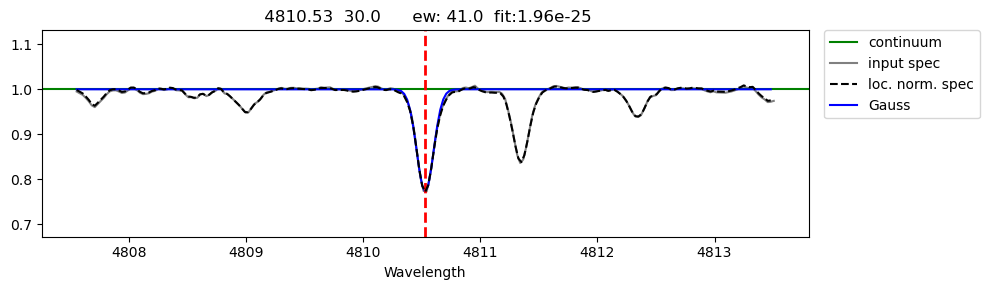

########################################
Writing to output file...

Moog entry:
    4810.53      30.0      4.08     -0.15                         41.04 1.965e-25 


#####
 4077.714 38.1
Points with flux values > 1.56 will be removed from continuum fit
0 point(s) removed
line 4077.714  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 311.77 fq = 0.000183 o-c: 0.014791
using an EW from Gauss
Line is too strong or too weak


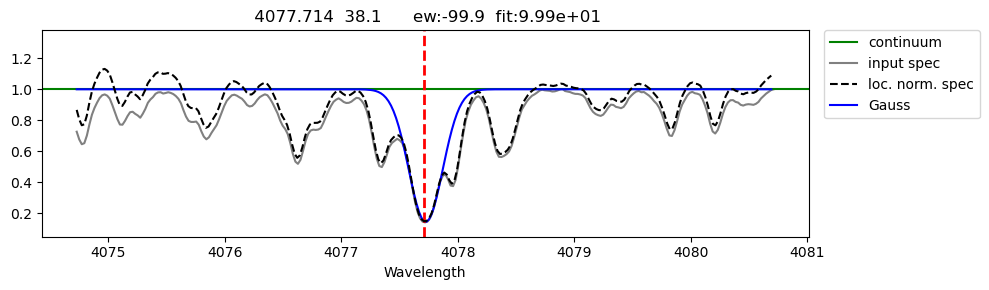

########################################
Writing to output file...

Moog entry:
   4077.714      38.1       0.0      0.15                        -99.90 9.990e+01 


#####
 4215.524 38.1
Points with flux values > 1.51 will be removed from continuum fit
0 point(s) removed
line 4215.524  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 253.87 fq = 0.000006 o-c: 0.009292
using an EW from Gauss
Line is too strong or too weak


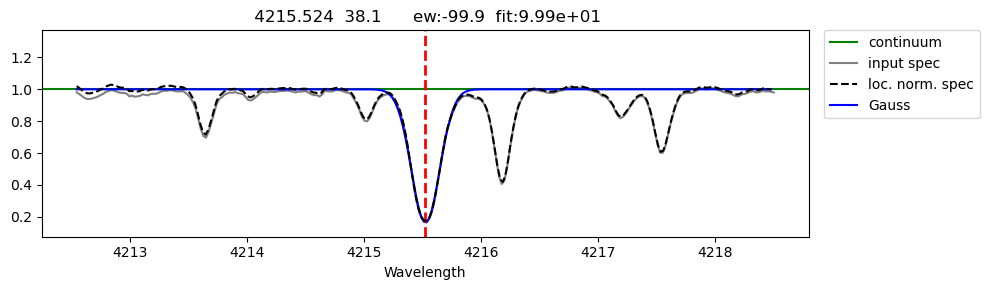

########################################
Writing to output file...

Moog entry:
   4215.524      38.1       0.0     -0.17                        -99.90 9.990e+01 


#####
 4398.01 39.1
Points with flux values > 1.49 will be removed from continuum fit
0 point(s) removed
line 4398.01  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 68.23 fq = 0.000000 o-c: 0.006846
using an EW from Gauss


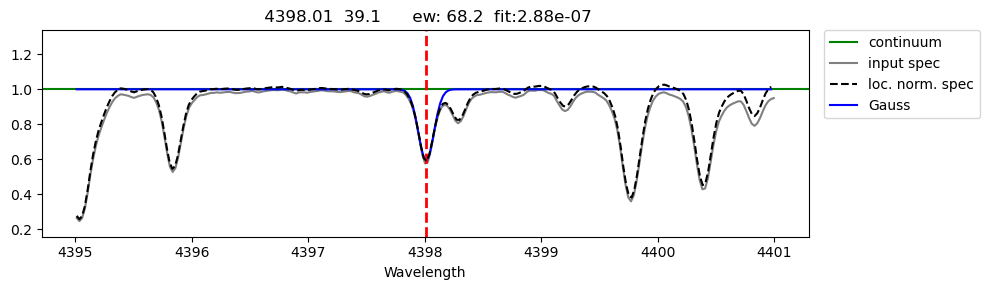

########################################
Writing to output file...

Moog entry:
    4398.01      39.1      0.13      -1.0                         68.23 2.882e-07 


#####
 4682.325 39.1
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 4682.325  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 26.26 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


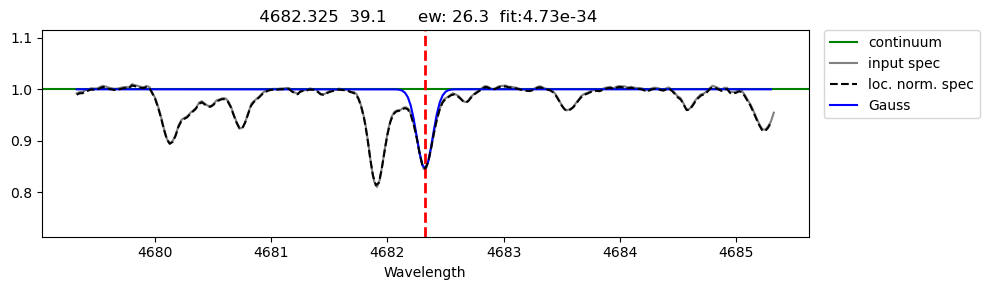

########################################
Writing to output file...

Moog entry:
   4682.325      39.1      0.41     -1.51                         26.26 4.727e-34 


#####
 4883.684 39.1
Points with flux values > 1.19 will be removed from continuum fit
0 point(s) removed
line 4883.684  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 77.06 fq = 0.000000 o-c: 0.000109
using an EW from Gauss


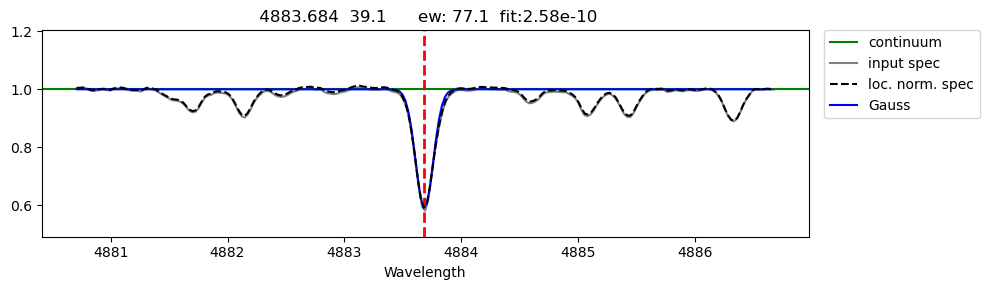

########################################
Writing to output file...

Moog entry:
   4883.684      39.1      1.08      0.07                         77.06 2.583e-10 


#####
 5662.925 39.1
Points with flux values > 1.11 will be removed from continuum fit
0 point(s) removed
line 5662.925  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 38.99 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


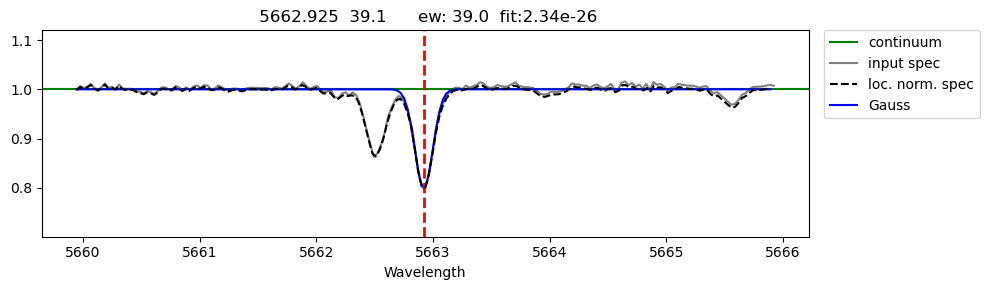

########################################
Writing to output file...

Moog entry:
   5662.925      39.1      1.94      0.16                         38.99 2.339e-26 


#####
 4258.041 40.1
Points with flux values > 1.38 will be removed from continuum fit
0 point(s) removed
line 4258.041  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 92.41 fq = 0.000526 o-c: 0.014901
using an EW from Gauss


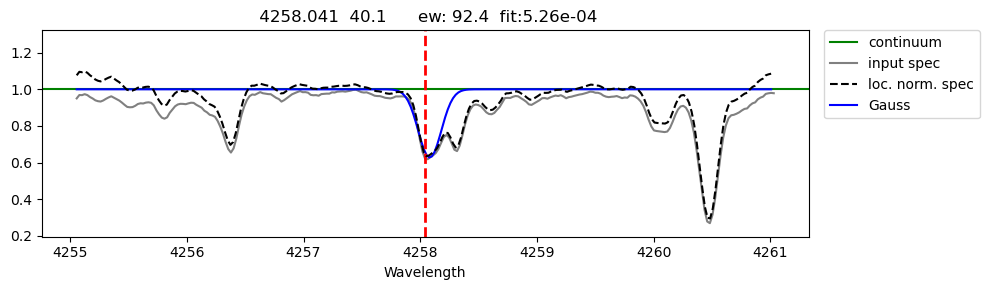

########################################
Writing to output file...

Moog entry:
   4258.041      40.1      0.56      -1.2                         92.41 5.265e-04 


#####
 4208.98 40.1
Points with flux values > 1.38 will be removed from continuum fit
0 point(s) removed
line 4208.98  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 73.46 fq = 0.000000 o-c: 0.004811
using an EW from Gauss


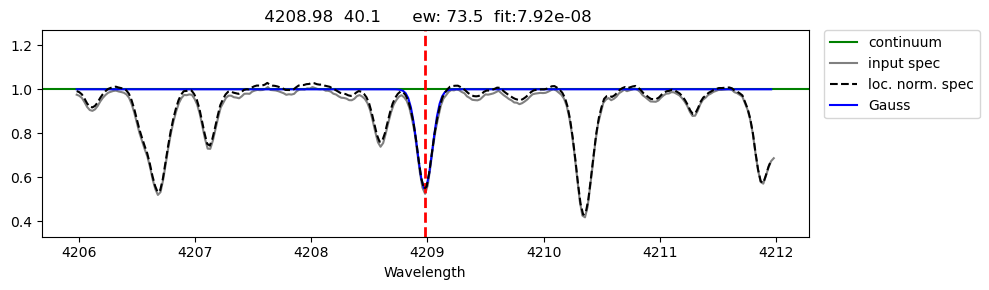

########################################
Writing to output file...

Moog entry:
    4208.98      40.1      0.71     -0.51                         73.46 7.918e-08 


#####
 4496.962 40.1
Points with flux values > 1.29 will be removed from continuum fit
0 point(s) removed
line 4496.962  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 96.03 fq = 0.000153 o-c: 0.006739
using an EW from Gauss


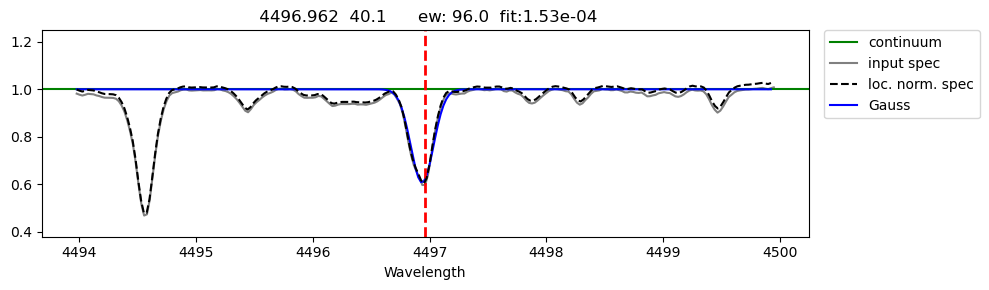

########################################
Writing to output file...

Moog entry:
   4496.962      40.1      0.71     -0.89                         96.03 1.527e-04 


#####
 4934.076 56.1
Points with flux values > 1.43 will be removed from continuum fit
0 point(s) removed
line 4934.076  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 236.85 fq = 0.000001 o-c: 0.003359
using an EW from Gauss
Line is too strong or too weak


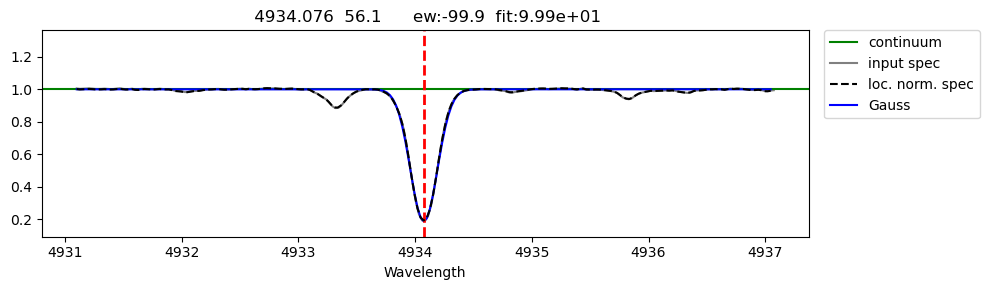

########################################
Writing to output file...

Moog entry:
   4934.076      56.1       0.0     -0.15                        -99.90 9.990e+01 


#####
 4554.029 56.1
Points with flux values > 1.48 will be removed from continuum fit
0 point(s) removed
line 4554.029  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 236.35 fq = 0.000004 o-c: 0.009061
using an EW from Gauss
Line is too strong or too weak


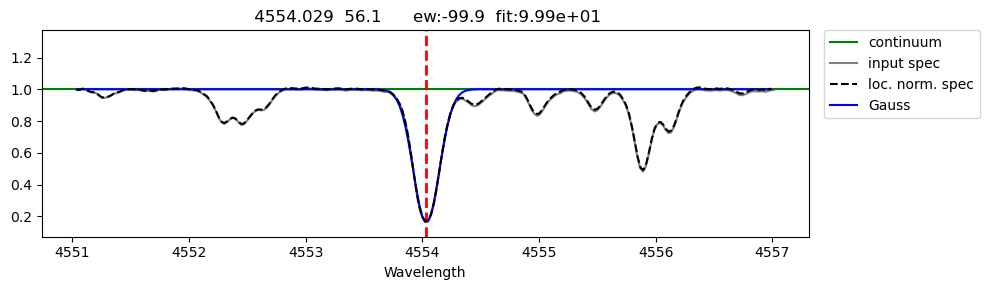

########################################
Writing to output file...

Moog entry:
   4554.029      56.1       0.0      0.17                        -99.90 9.990e+01 


#####
 6496.897 56.1
Points with flux values > 1.35 will be removed from continuum fit
0 point(s) removed
line 6496.897  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 172.24 fq = 0.000000 o-c: 0.000136
using an EW from Gauss
Line is too strong or too weak


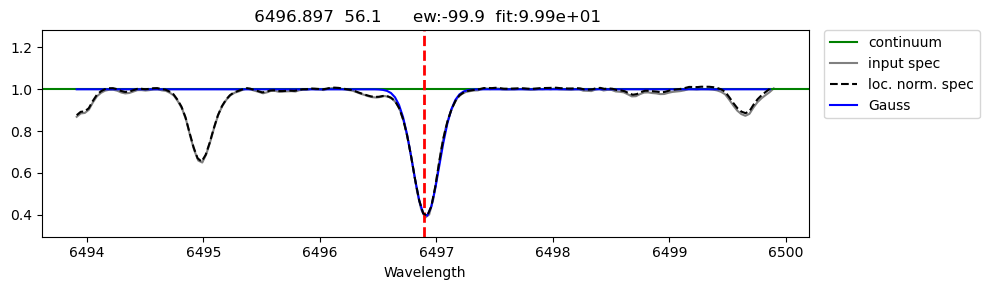

########################################
Writing to output file...

Moog entry:
   6496.897      56.1       0.6     -0.38                        -99.90 9.990e+01 


#####
 5853.668 56.1
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
line 5853.668  was detected and it was classified as a strong line
I see 2 line(s) in this range
          Gauss : EW = 99.48 fq = 0.000000 o-c: 0.000218
using an EW from Gauss


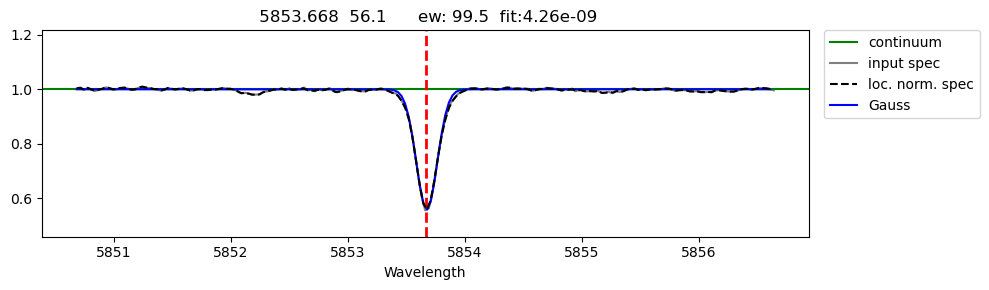

########################################
Writing to output file...

Moog entry:
   5853.668      56.1       0.6      -1.0                         99.48 4.261e-09 


#####
 6141.713 56.1
Points with flux values > 1.32 will be removed from continuum fit
0 point(s) removed
line 6141.713  was detected and it was classified as a strong line
I see 1 line(s) in this range
          Gauss : EW = 160.91 fq = 0.000000 o-c: 0.000630
using an EW from Gauss
Line is too strong or too weak


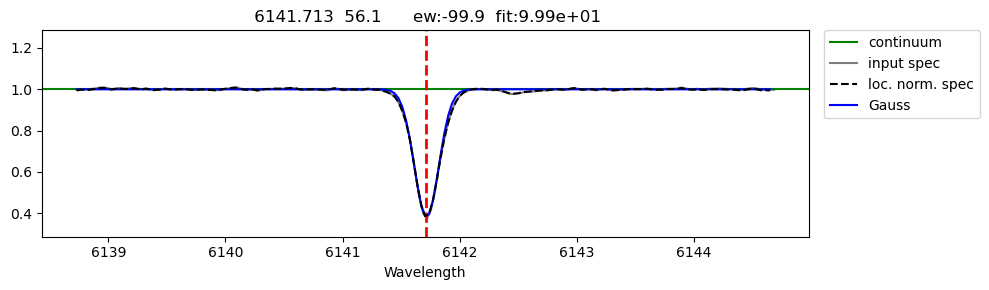

########################################
Writing to output file...

Moog entry:
   6141.713      56.1       0.7     -0.08                        -99.90 9.990e+01 


#####
 4662.498 57.1
Points with flux values > 1.07 will be removed from continuum fit
0 point(s) removed
line 4662.498  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 22.79 fq = 0.624575 o-c: 0.016089
using an EW from Gauss


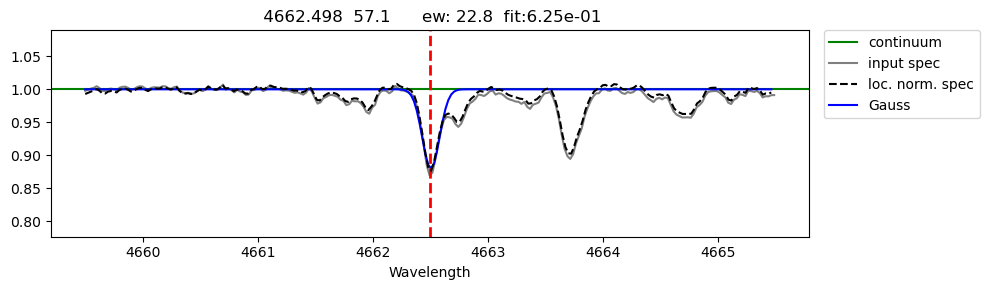

########################################
Writing to output file...

Moog entry:
   4662.498      57.1       0.0     -1.24                         22.79 6.246e-01 


#####
 5290.82 57.1
Points with flux values > 1.07 will be removed from continuum fit
0 point(s) removed
line 5290.82  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 7.08 fq = 43698.720468 o-c: 0.021576
using an EW from Gauss
Line is too strong or too weak


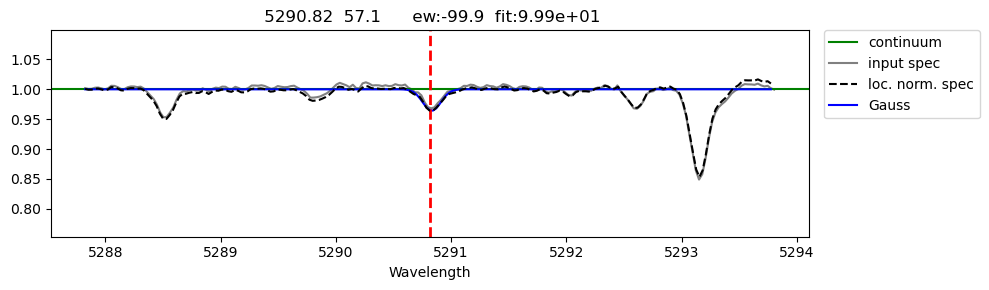

########################################
Writing to output file...

Moog entry:
    5290.82      57.1       0.0     -1.65                        -99.90 9.990e+01 


#####
 5482.268 57.1
Points with flux values > 1.04 will be removed from continuum fit
0 point(s) removed
line 5482.268  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 1.00 fq = 301947365231798976.000000 o-c: 0.011729
using an EW from Gauss
Line is too strong or too weak


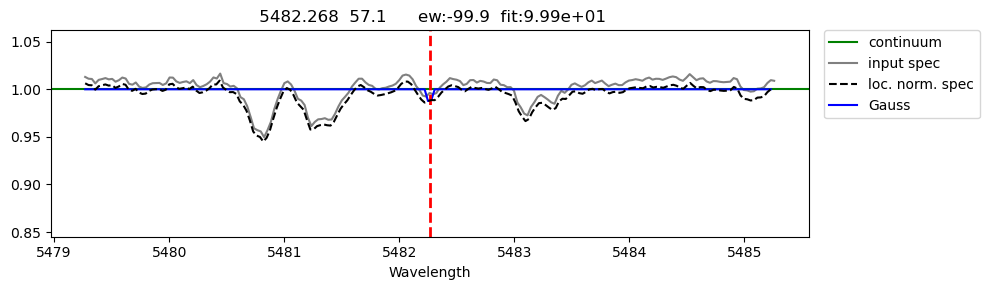

########################################
Writing to output file...

Moog entry:
   5482.268      57.1       0.0     -2.06                        -99.90 9.990e+01 


#####
 3942.151 58.1
Points with flux values > 1.37 will be removed from continuum fit
0 point(s) removed
line 3942.151  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 30.90 fq = 0.000003 o-c: 0.015780
using an EW from Gauss


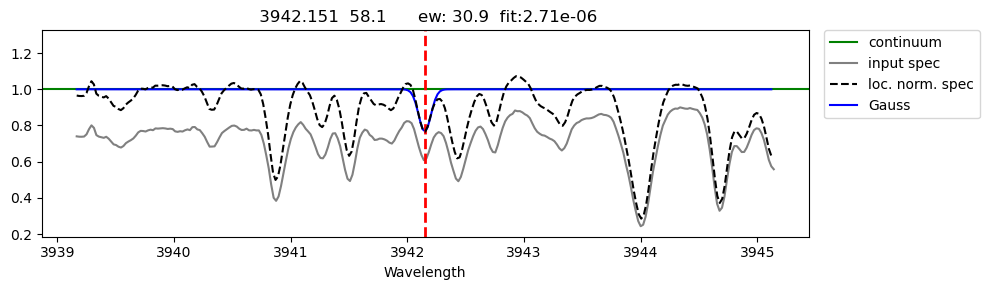

########################################
Writing to output file...

Moog entry:
   3942.151      58.1       0.0     -0.22                         30.90 2.710e-06 


#####
 4053.503 58.1
Points with flux values > 1.31 will be removed from continuum fit
0 point(s) removed
line 4053.503  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 21.75 fq = 0.000002 o-c: 0.006943
using an EW from Gauss


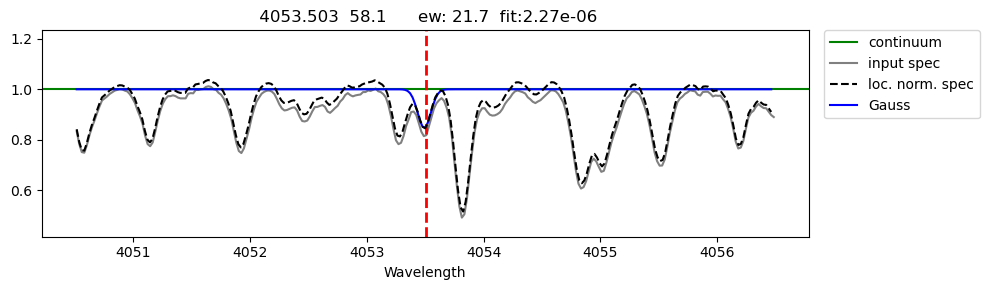

########################################
Writing to output file...

Moog entry:
   4053.503      58.1       0.0     -0.61                         21.75 2.266e-06 


#####
 4225.317 59.1
Points with flux values > 1.54 will be removed from continuum fit
0 point(s) removed
4225.317 was not detected
I see 11 line(s) in this range
          Gauss : EW = 175.66 fq = 0.001913 o-c: 0.015686
using an EW from Gauss
Line is too strong or too weak
4225.317 line outside the det_level range


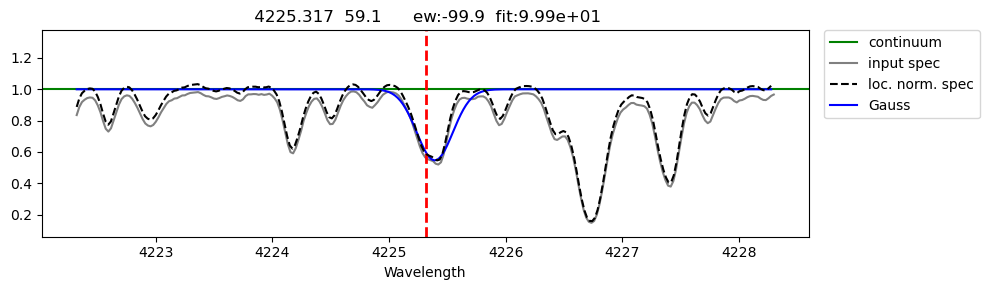

########################################
Writing to output file...

Moog entry:
   4225.317      59.1       0.0      0.11                        -99.90 9.990e+01 


#####
 4044.813 59.1
Points with flux values > 1.54 will be removed from continuum fit
0 point(s) removed
I see this line at 4044.813 , but it is weak
I see 14 line(s) in this range
Covariance matrix is empty
          Gauss : EW = 0.05 fq = 231624734.816999 o-c: 0.080038
using an EW from Gauss
Line is too strong or too weak
4044.813 line outside the det_level range


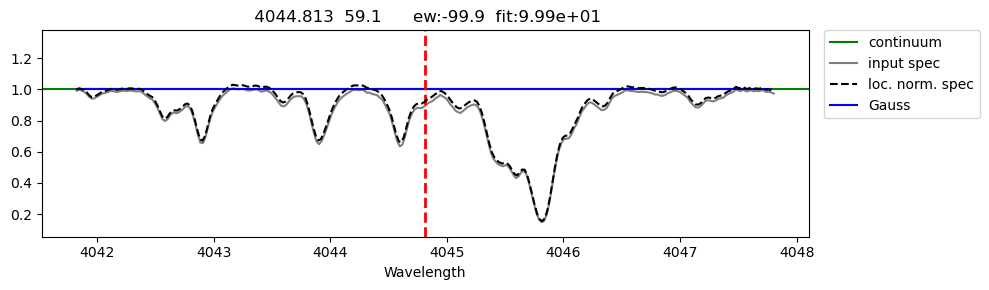

########################################
Writing to output file...

Moog entry:
   4044.813      59.1       0.0     -0.28                        -99.90 9.990e+01 


#####
 4408.819 59.1
Points with flux values > 1.31 will be removed from continuum fit
0 point(s) removed
line 4408.819  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 43.10 fq = 0.000000 o-c: 0.000536
using an EW from Gauss


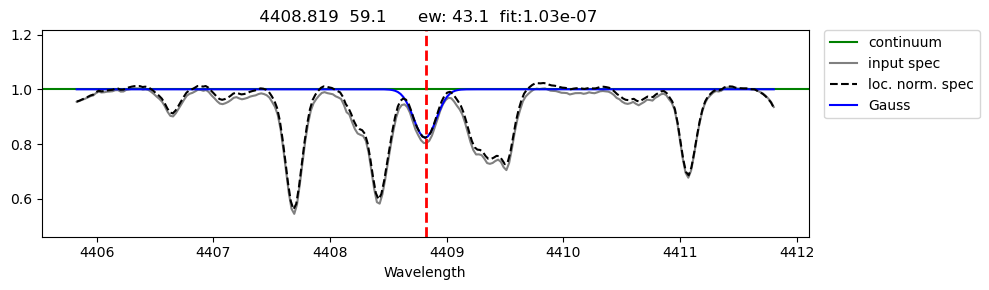

########################################
Writing to output file...

Moog entry:
   4408.819      59.1       0.0      -0.3                         43.10 1.029e-07 


#####
 3994.791 59.1
Points with flux values > 1.37 will be removed from continuum fit
0 point(s) removed
3994.791 was not detected
I see 14 line(s) in this range
          Gauss : EW = 60.31 fq = 0.000060 o-c: 0.013472
using an EW from Gauss
3994.791 line outside the det_level range


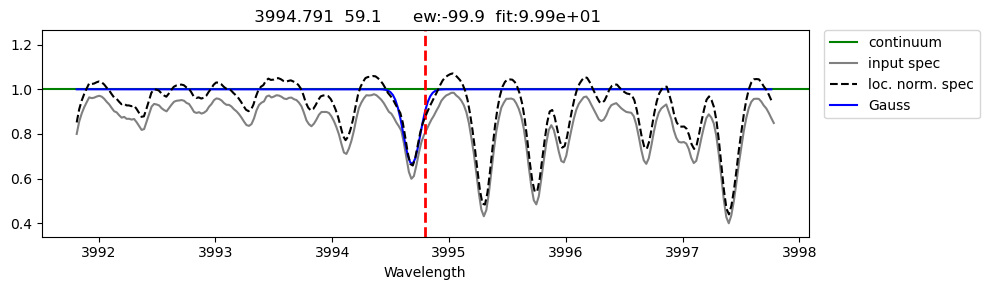

########################################
Writing to output file...

Moog entry:
   3994.791      59.1      0.06       0.1                        -99.90 9.990e+01 


#####
 3964.812 59.1
Points with flux values > 1.58 will be removed from continuum fit
0 point(s) removed
line 3964.812  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 8.22 fq = 0.000050 o-c: 0.007405
using an EW from Gauss
Line is too strong or too weak


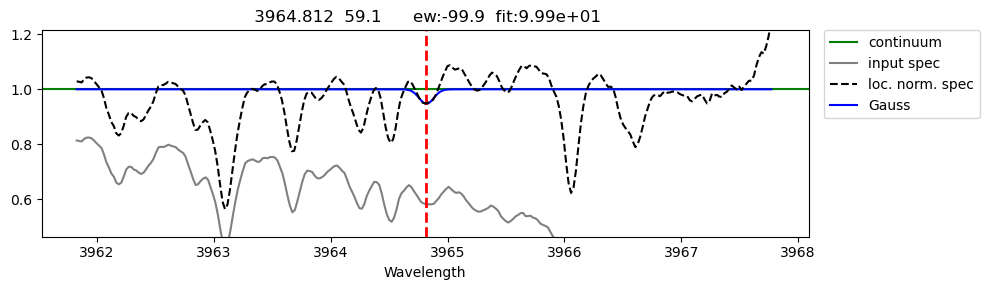

########################################
Writing to output file...

Moog entry:
   3964.812      59.1      0.06      -0.1                        -99.90 9.990e+01 


#####
 4222.934 59.1
Points with flux values > 1.36 will be removed from continuum fit
0 point(s) removed
line 4222.934  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 45.74 fq = 0.000000 o-c: 0.002429
using an EW from Gauss


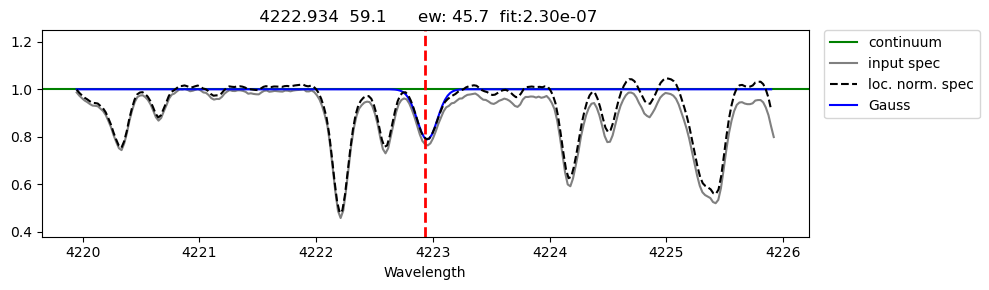

########################################
Writing to output file...

Moog entry:
   4222.934      59.1      0.06      0.13                         45.74 2.299e-07 


#####
 4496.46 59.1
Points with flux values > 1.29 will be removed from continuum fit
0 point(s) removed
I see this line at 4496.46 , but it is weak
I see 9 line(s) in this range
          Gauss : EW = 31.91 fq = 0.000363 o-c: 0.000285
using an EW from Gauss


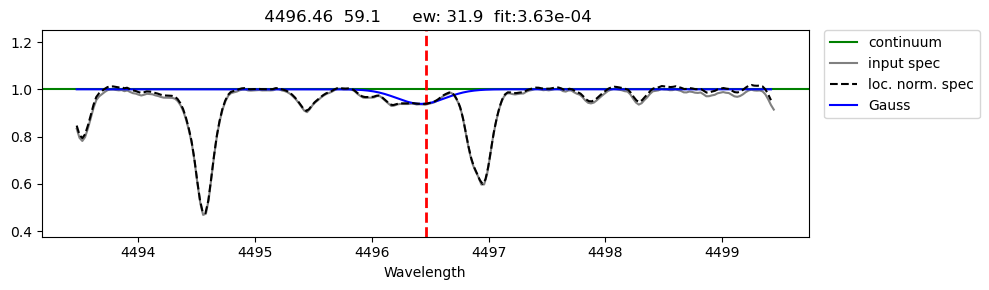

########################################
Writing to output file...

Moog entry:
    4496.46      59.1      0.06     -0.37                         31.91 3.629e-04 


#####
 4109.45 60.1
Points with flux values > 1.33 will be removed from continuum fit
0 point(s) removed
line 4109.45  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 77.73 fq = 0.000000 o-c: 0.001481
using an EW from Gauss


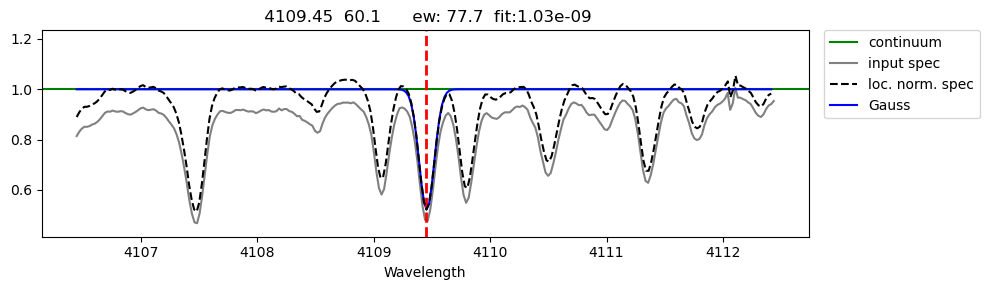

########################################
Writing to output file...

Moog entry:
    4109.45      60.1      0.32      0.35                         77.73 1.028e-09 


#####
 4061.08 60.1
Points with flux values > 1.48 will be removed from continuum fit
0 point(s) removed
line 4061.08  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 71.64 fq = 0.000000 o-c: 0.003045
using an EW from Gauss


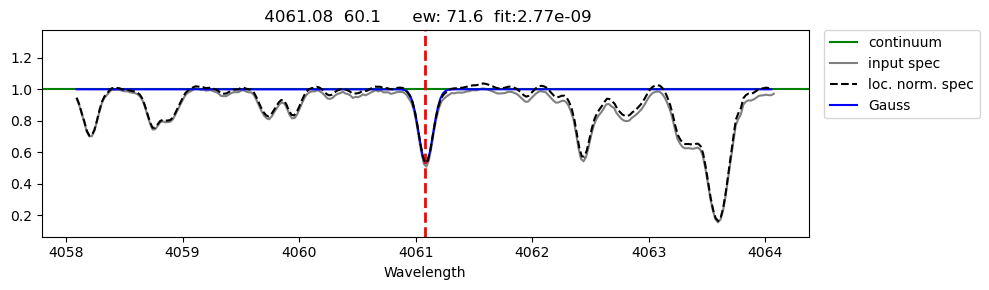

########################################
Writing to output file...

Moog entry:
    4061.08      60.1      0.47      0.55                         71.64 2.768e-09 


#####
 4704.4 62.1
Points with flux values > 1.29 will be removed from continuum fit
0 point(s) removed
line 4704.4  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 25.81 fq = 0.000000 o-c: 0.000739
using an EW from Gauss


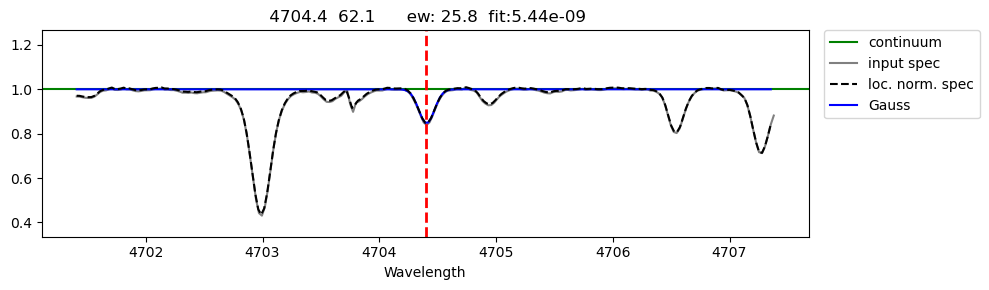

########################################
Writing to output file...

Moog entry:
     4704.4      62.1       0.0     -0.86                         25.81 5.438e-09 


#####
 4648.16 62.1
Points with flux values > 1.18 will be removed from continuum fit
0 point(s) removed
line 4648.16  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 6.09 fq = 0.000000 o-c: 0.000016
using an EW from Gauss
Line is too strong or too weak


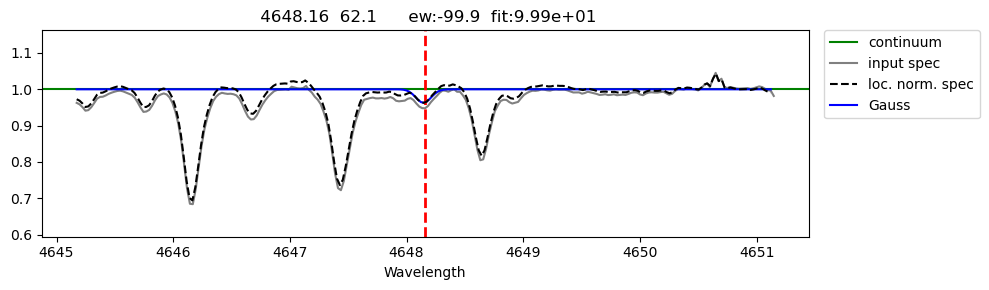

########################################
Writing to output file...

Moog entry:
    4648.16      62.1       0.0     -1.51                        -99.90 9.990e+01 


#####
 4205.042 63.1
Points with flux values > 1.51 will be removed from continuum fit
0 point(s) removed
line 4205.042  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 245.57 fq = 0.000338 o-c: 0.020867
using an EW from Gauss
Line is too strong or too weak


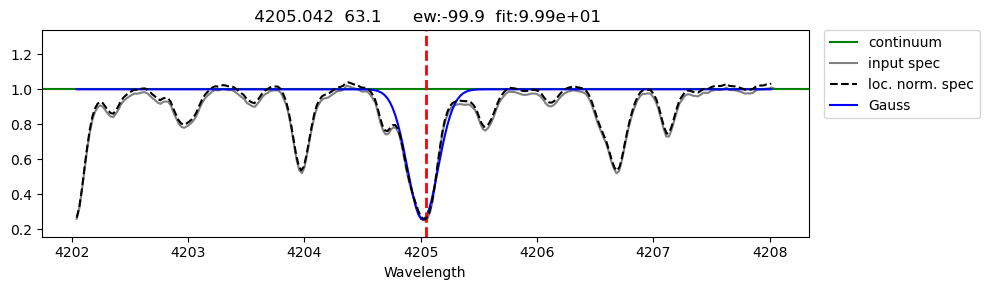

########################################
Writing to output file...

Moog entry:
   4205.042      63.1       0.0      0.12                        -99.90 9.990e+01 


#####
 4129.725 63.1
Points with flux values > 1.49 will be removed from continuum fit
0 point(s) removed
line 4129.725  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 183.43 fq = 0.000012 o-c: 0.016330
using an EW from Gauss
Line is too strong or too weak


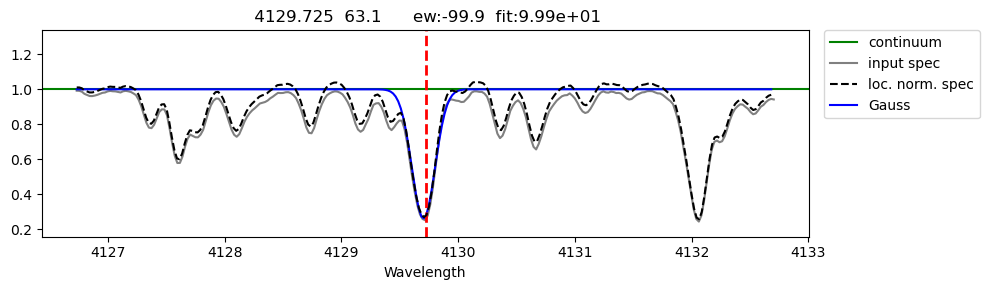

########################################
Writing to output file...

Moog entry:
   4129.725      63.1       0.0       0.2                        -99.90 9.990e+01 


#####
 6645.064 63.1
Points with flux values > 1.08 will be removed from continuum fit
0 point(s) removed
line 6645.064  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 31.19 fq = 1.272915 o-c: 0.016140
using an EW from Gauss


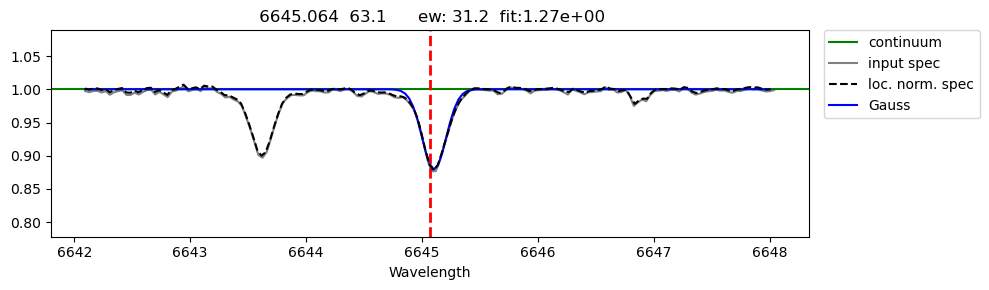

########################################
Writing to output file...

Moog entry:
   6645.064      63.1      1.38       0.2                         31.19 1.273e+00 


#####
 4449.7 66.1
Points with flux values > 1.35 will be removed from continuum fit
0 point(s) removed
line 4449.7  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 49.27 fq = 0.000000 o-c: 0.001239
using an EW from Gauss


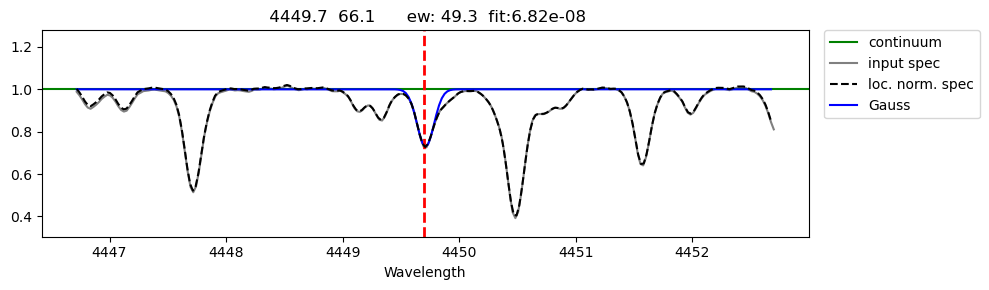

########################################
Writing to output file...

Moog entry:
     4449.7      66.1       0.0     -1.03                         49.27 6.818e-08 


#####
 4409.38 66.1
Points with flux values > 1.31 will be removed from continuum fit
0 point(s) removed
4409.38 was not detected
I see 11 line(s) in this range
          Gauss : EW = 147.70 fq = 0.036209 o-c: 0.001615
using an EW from Gauss
Line is too strong or too weak


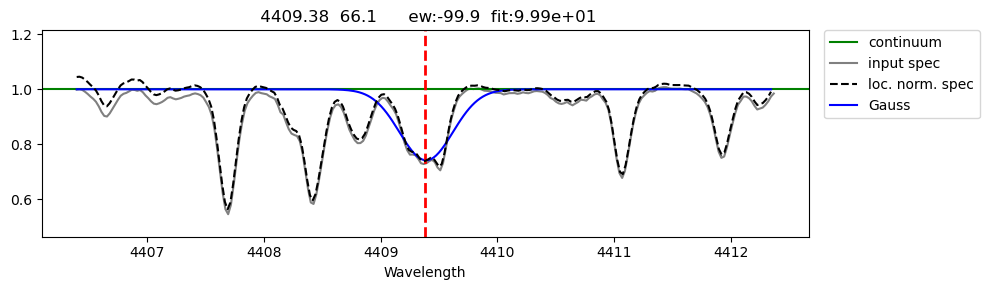

########################################
Writing to output file...

Moog entry:
    4409.38      66.1       0.0     -1.24                        -99.90 9.990e+01 


#####
 4045.474 67.1
Points with flux values > 1.54 will be removed from continuum fit
0 point(s) removed
line 4045.474  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 329.83 fq = 2.870816 o-c: 0.036761
using an EW from Gauss
Line is too strong or too weak
4045.474 line outside the det_level range


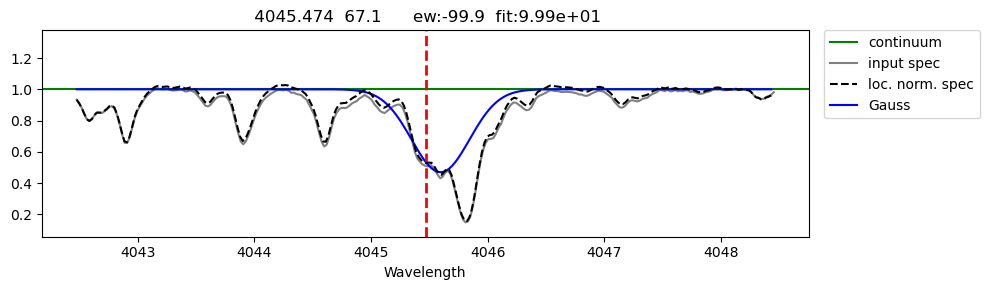

########################################
Writing to output file...

Moog entry:
   4045.474      67.1       0.0     -0.18                        -99.90 9.990e+01 


#####
 4242.15 69.1
Points with flux values > 1.24 will be removed from continuum fit
0 point(s) removed
line 4242.15  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 18.31 fq = 0.000000 o-c: 0.000829
using an EW from Gauss
Line is too strong or too weak


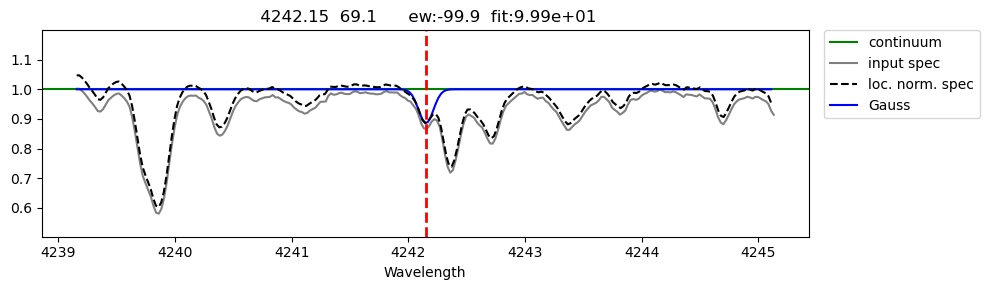

########################################
Writing to output file...

Moog entry:
    4242.15      69.1      0.03     -0.95                        -99.90 9.990e+01 


#####
 4057.807 82.0
Points with flux values > 1.32 will be removed from continuum fit
0 point(s) removed
4057.807 was not detected
I see 14 line(s) in this range
Covariance matrix is empty
          Gauss : EW = 0.07 fq = 71032047.802110 o-c: 0.017349
using an EW from Gauss
Line is too strong or too weak


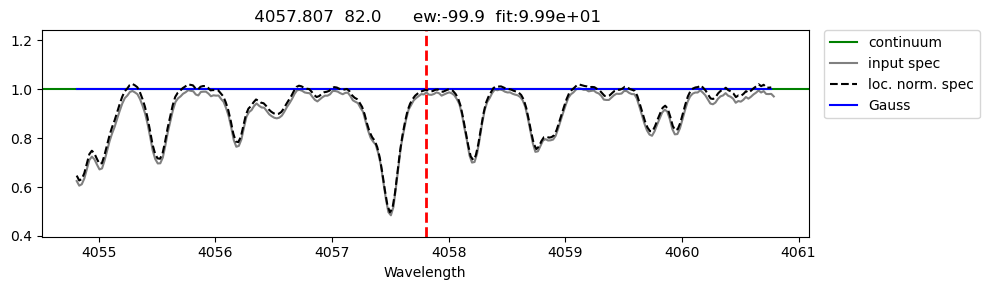

########################################
Writing to output file...

Moog entry:
   4057.807      82.0      1.32     -0.17                        -99.90 9.990e+01 


#####
 4019.129 90.1
Points with flux values > 1.31 will be removed from continuum fit
0 point(s) removed
line 4019.129  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 28.07 fq = 0.000006 o-c: 0.003745
using an EW from Gauss


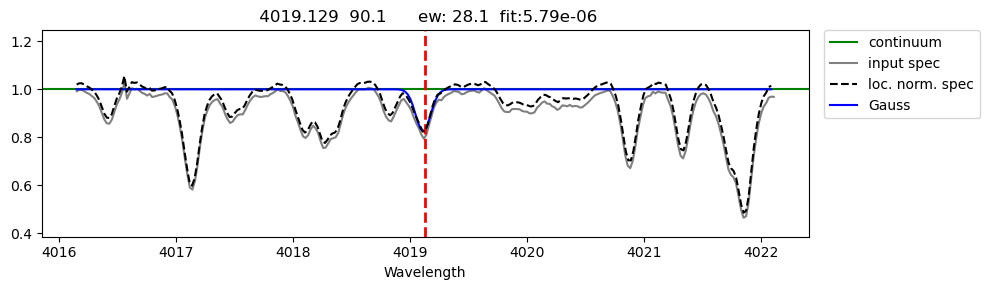

########################################
Writing to output file...

Moog entry:
   4019.129      90.1       0.0     -0.65                         28.07 5.792e-06 


#####
 4086.521 90.1
Points with flux values > 1.31 will be removed from continuum fit
0 point(s) removed
4086.521 was not detected
I see 14 line(s) in this range
          Gauss : EW = 0.16 fq = 1896655704330.189453 o-c: 0.036587
using an EW from Gauss
Line is too strong or too weak


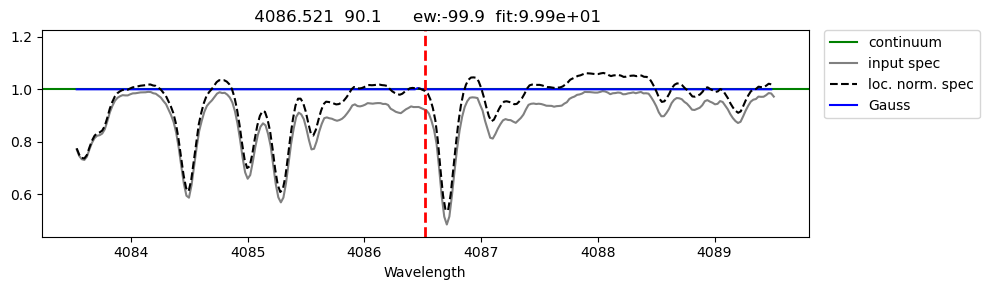

########################################
Writing to output file...

Moog entry:
   4086.521      90.1       0.0     -1.46                        -99.90 9.990e+01 


#####
 4094.747 90.1
Points with flux values > 1.21 will be removed from continuum fit
0 point(s) removed
4094.747 was not detected
I see 10 line(s) in this range
          Gauss : EW = 23.27 fq = 0.000669 o-c: 0.000277
using an EW from Gauss


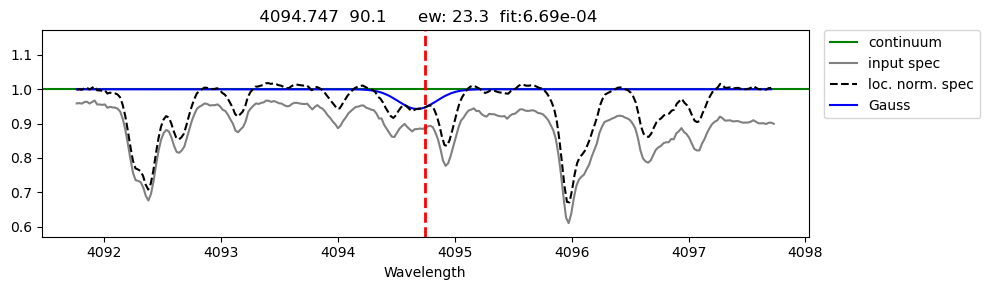

########################################
Writing to output file...

Moog entry:
   4094.747      90.1       0.0     -1.46                         23.27 6.687e-04 


#####
 3859.571 92.1
Points with flux values > 1.54 will be removed from continuum fit
0 point(s) removed
3859.571 was not detected
I see 11 line(s) in this range
Covariance matrix is empty
          Gauss : EW = 2478573.41 fq = 3051312279034.479980 o-c: 0.023698
using an EW from Gauss
Line is too strong or too weak
3859.571 line outside the det_level range


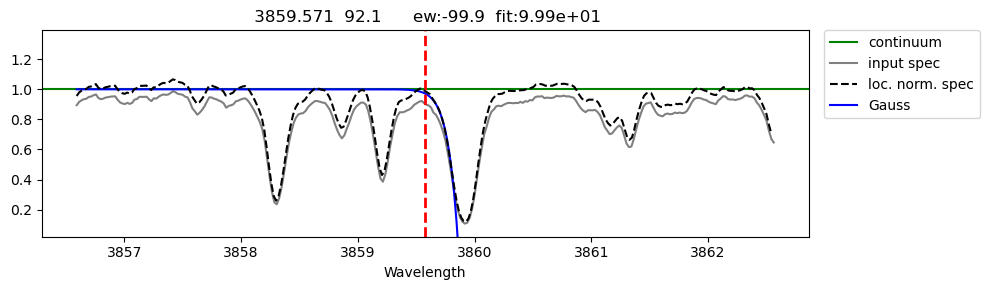

########################################
Writing to output file...

Moog entry:
   3859.571      92.1      0.04      -0.1                        -99.90 9.990e+01 


#####
 4241.664 92.1
Points with flux values > 1.29 will be removed from continuum fit
0 point(s) removed
I see this line at 4241.664 , but it is weak
I see 11 line(s) in this range
Covariance matrix is empty
          Gauss : EW = 22800.68 fq = 14281956890.436859 o-c: 0.000509
using an EW from Gauss
Line is too strong or too weak
4241.664 line outside the det_level range


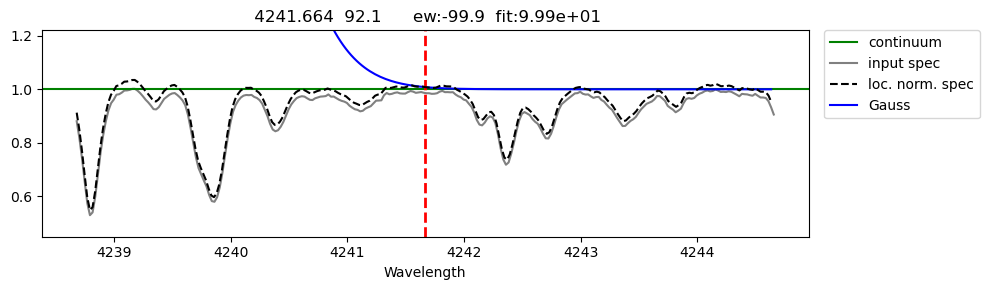

########################################
Writing to output file...

Moog entry:
   4241.664      92.1      0.57     -0.43                        -99.90 9.990e+01 



In [20]:
# Call main function
run_pyew(config, line_list, flist)

### Optionally: Create linelist with only good lines for this star
(saves time for future rerunning)

In [12]:
pyew_out_file = f'{pyew_output_dir}/{output_name}' #f'{pyew_output_dir}/{star_id}/{output_name}'


###OPTION ONE: remove bad lines################################
ignored_lines = find_lines_ignored_for_moog_entry(pyew_out_file) # lines with -99.90 moog entry
bad_lines = ignored_lines + []
filtered_lines = filter_linelist(line_list_file, bad_lines, 'b')
###############################################################

###OPTION TWO: retain only good lines###########################
  ##Manually input the wavelength:
#good_lines = []
  ##Or point this function to the file with your best lines for this object:
#file_path = f'{pyew_output_dir}/..' #your file path
#good_lines = get_lines(file_path)

#filtered_lines = filter_linelist(line_list_file, good_lines, 'g') 
##################################################################

filtered_line_list_file = f'{pyEW_dir}/PYEW_INPUT/other_best_lines_{star_id}.linelist'
write_filtered_linelist(filtered_lines, filtered_line_list_file)

### Clean  pyEW output file (used as MOOG input): 
#### Option one: remove poorly fitted lines 
#### Option two: retain only good lines and remove the rest

In [14]:
pyew_out_file = f'{pyew_output_dir}/{output_name}' #{pyew_output_dir}/{star_id}/{output_name}'
ignored_lines = find_lines_ignored_for_moog_entry(pyew_out_file) # lines with -99.90 moog entry
fit_lines_dir = f'{pyew_output_dir}/fit_lines'

###OPTION ONE:###
lines_to_remove = ignored_lines + [] 
remove_lines(pyew_out_file, fit_lines_dir, lines_to_remove) 


###OPTION TWO:###
#good_lines = []
#keep_good_lines(pyew_out_file, fit_lines_dir, good_lines)


# Combine well-fitted individual line plots into a single .png image. You can find it in PYEW_OUTPUT/fit_lines.
combined_filename = f'combined_fit_others_lines_{base_name}{suffix}.png'
combine_png_files(fit_lines_dir, combined_filename)

#### Fit the lines using different continuum renormalization/scaling (i.e., different divisors) and select the best measurements. Store these measurements in the separate pyew_out_file

#### Sort output files in `fit_lines_dir` and `pyew_output_dir`

In [23]:
source_dir = pyew_output_dir  #pyew_output_dir # fit_lines_dir

destination_dir = os.path.join(source_dir, star_id)
os.makedirs(destination_dir, exist_ok=True)

for item in os.listdir(source_dir):
    source_item = os.path.join(source_dir, item)
    if os.path.isfile(source_item) and star_id in item:
        destination_file = os.path.join(destination_dir, item)
        shutil.move(source_item, destination_file)

print(f"All files containing '{star_id}' in their name in {source_dir} have been moved to the folder '{star_id}'.")

All files containing 'HD222925' in their name in /arc5/home/dariazaremba/PY_LOOPER/pyEW_modified/PYEW_OUTPUT have been moved to the folder 'HD222925'.


# 2. Run MOOG to get elemental abundances

In [11]:
import os
import csv
import matplotlib.pyplot as plt
import pandas as pd
os.chdir(moog_dir)


import q2
from data_processing_utils import *

MOOGSILENT is available in /astro/dariazaremba/q2-tools/MOOG-for-q2


## Create lines.csv file with measured ew for running q2

In [12]:
###PROVIDE THE NAME OF THE FINAL pyew_out_file WITH FINAL EW MEASUREMENTS:
pyew_out_file = f'{pyew_output_dir}/{star_id}/{output_name}'
write_lines_csv(pyew_out_file, star_id)

In [13]:
solution_file = f'{star_id}_solution.csv'
solution_df = pd.read_csv(solution_file)

teff = solution_df['teff'][0]
logg = solution_df['logg'][0]
feh = solution_df['feh_model'][0]
vt = solution_df['vt'][0]


moog_out_path = f"{moog_dir}/MOOG_OUTPUT_{star_id}_{teff}_{logg}_{feh}_{vt}"

In [14]:
data = q2.Data(solution_file, 'lines.csv')

star = q2.Star(star_id)
star.get_data_from(data)
star.get_model_atmosphere('marcs')

In [15]:
available_species = get_available_species(star_id, 'lines.csv')
print(available_species)

['BaII', 'CaI', 'CeII', 'CrI', 'DyII', 'EuII', 'KI', 'LaII', 'MgI', 'MnI', 'NdII', 'NiI', 'ScII', 'SmII', 'YII', 'ZnI', 'ZrII']


### Get line-by-line abundnce for each species


Now we just need to tell q<sup>2</sup> which species we are interested in measuring. We can specify which species we want to compute abundances for by passing a species_ids list to q2.abundances.get_one. The latter is a function that calculates the abundances of elements included in species_ids for a star object (if lines are available). The q2.abundances.get_one function does not print anything on screen unless its parameter "silent" is set to False.

In [16]:
species_ids = available_species
q2.abundances.get_one(star, species_ids)

The q2.abundances.get_one function adds "species" attributes to the star object. For example, star.CI contains the results of the CI abundace calculation. This new attribute is an array, and the line-by-line abundances are in the 'ab' column:

### Make some plots to look for outliers and investigate line-to-line scatter

In [39]:
%matplotlib nbagg
for sp in species_ids:
    q2.abundances.fancy_abund_plot(star, sp)

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

### Propagate errors

In [40]:
q2.abundances.get_one(star,species_ids,  silent=False, errors=True)

*** Begin BaII:
A(BaII)  =  1.379 +/- 0.000 (# of lines = 1)
-----------------------------
Error propagation for BaII:
Line to line scatter:  0.000
Error from Teff:       0.078
Error from logg:       0.080
Error from [Fe/H]:     0.000
Error from vt:         0.053
                      -------
Total abundance error: 0.123
-----------------------------
---BaII done
*** Begin CaI:
A(CaI)  =  5.041 +/- 0.155 (# of lines = 7)
-----------------------------
Error propagation for CaI:
Line to line scatter:  0.063
Error from Teff:       0.078
Error from logg:       0.002
Error from [Fe/H]:     0.000
Error from vt:         0.024
                      -------
Total abundance error: 0.103
-----------------------------
---CaI done
*** Begin CeII:
A(CeII)  =  0.719 +/- 0.087 (# of lines = 2)
-----------------------------
Error propagation for CeII:
Line to line scatter:  0.087
Error from Teff:       0.077
Error from logg:       0.076
Error from [Fe/H]:     0.000
Error from vt:         0.006
        

In [17]:
def l_by_l_abund_species(sp, star):
    df = pd.DataFrame(getattr(star, sp))  
    df['id'] = sp_map.get(sp)
    df = df[['id'] + [col for col in df.columns if col != 'id']]
    return df

all_lines_ab_dfs = []

for sp in available_species:
    sp_df = l_by_l_abund_species(sp, star)
    all_lines_ab_dfs.append(sp_df)

l_by_l_abund_all_df = pd.concat(all_lines_ab_dfs, ignore_index=True)
#l_by_l_abund_all_df.to_csv(f'{moog_out_path}/moog_out_others_lbl.csv', index=False)
l_by_l_abund_all_df

,id,ww,ep,ew,rew,ab,difab,ref
0,56.1,5853.668,0.60,99.5,-4.770,1.379,None,None
1,20.0,6122.217,1.88,105.0,-4.766,5.282,None,None
2,20.0,6102.723,1.88,67.4,-4.957,5.167,None,None
3,20.0,6162.173,1.90,114.7,-4.730,4.950,None,None
4,20.0,6169.563,2.52,45.0,-5.137,4.839,None,None
...,...,...,...,...,...,...,...,...
63,30.0,4722.150,4.03,33.1,-5.154,3.119,None,None
64,30.0,4810.530,4.08,41.0,-5.069,3.086,None,None
65,40.1,4258.041,0.56,92.4,-4.664,2.641,None,None
66,40.1,4208.980,0.71,73.5,-4.758,1.743,None,None


In [34]:
#q2.abundances.get_all(data, f'{moog_out_path}/moog_out_others_average.csv', species_ids, grid='marcs', errors=True)

# 3. Apply HFS corrections

In [18]:
from HFS import *

q<sup>2</sup> is able to figure out when HFS is needed and it creates MOOG linelists in the proper format (it uses the "blends" driver instead of "abfind" in these situations). But we still have to add HFS lines to the lines.csv file, so that moog can read it. To do this, we will use two functions: 

`find_hfs_corrections` function is responsible for identifying the lines in a lines.csv file that require corrections based on a provided HFS file. It takes three arguments: hfs_file_path (the path to the HFS file), lines_csv_path (the path to the lines.csv), and an optional tolerance parameter for specifying the allowable difference in wavelength when comparing lines

`apply_hfs_corrections` function is responsible for adding the HFS lines identified by the find_hfs_corrections function to the lines.csv file (HFS lines start with '-' before the wavelength).

In [19]:
hfs_file_path = f'{moog_dir}/HFS/Ahfs.moog'
lines_csv_path = 'lines.csv'

hfs_lines = find_hfs_corrections(hfs_file_path, lines_csv_path, tolerance=0.03)

HFS corrections needed for 4320.732 (Species: 21.1 (ScII))
HFS corrections needed for 4324.996 (Species: 21.1 (ScII))
HFS corrections needed for 4400.389 (Species: 21.1 (ScII))
HFS corrections needed for 4415.557 (Species: 21.1 (ScII))
HFS corrections needed for 4033.062 (Species: 25.0 (MnI))
HFS corrections needed for 4034.483 (Species: 25.0 (MnI))


In [20]:
# Add lines with HFS (starting with '-') to lines.csv file
apply_hfs_corrections(hfs_file_path, lines_csv_path, hfs_lines) 

At this point, the **lines.csv** file should contain lines beginning with '-' indicating HFS corrections

Let's recalculate the abundances of the species for which we applied HFS corrections.

In [21]:
sp_map_reverse = {v: k for k, v in sp_map.items()}
    
hfs_species_id = {line['species'] for line in hfs_lines}
hfs_species_name = [sp_map_reverse.get(species_id) for species_id in hfs_species_id]

data = q2.Data(f'{star_id}_solution.csv', 'lines.csv')
star = q2.Star(star_id)
star.get_data_from(data)
star.get_model_atmosphere('marcs')

q2.abundances.get_one(star, hfs_species_name)



hfs_lines_ab_dfs = []

for sp in hfs_species_name:
    sp_df = l_by_l_abund_species(sp, star)
    hfs_lines_ab_dfs.append(sp_df)

l_by_l_abund_hfs_df = pd.concat(hfs_lines_ab_dfs, ignore_index=True)
hfs_cor_df = pd.merge(l_by_l_abund_all_df, l_by_l_abund_hfs_df, on='ww', suffixes=('', '_hfscor'))
hfs_cor_df.drop(['ep_hfscor', 'id_hfscor', 'ew_hfscor', 'rew_hfscor', 'difab_hfscor', 'ref_hfscor'], axis=1, inplace=True, errors='ignore')


#merged_df.to_csv(f'{moog_out_path}/moog_out_other_lbl_HFS.csv', index=False)
hfs_cor_df

,id,ww,ep,ew,rew,ab,difab,ref,ab_hfscor
0,25.0,4033.062,0.00,137.0,-4.469,3.901,None,None,3.534
1,25.0,4034.483,0.00,114.7,-4.546,3.556,None,None,3.257
2,21.1,4324.996,0.59,116.1,-4.571,1.964,None,None,1.661
3,21.1,4415.557,0.59,98.4,-4.652,1.780,None,None,1.490
4,21.1,4320.732,0.60,134.3,-4.507,2.186,None,None,1.930
5,21.1,4400.389,0.60,104.5,-4.624,1.781,None,None,1.495
6,21.1,4374.457,0.62,110.5,-4.598,1.875,None,None,1.856


<IPython.core.display.Javascript object>


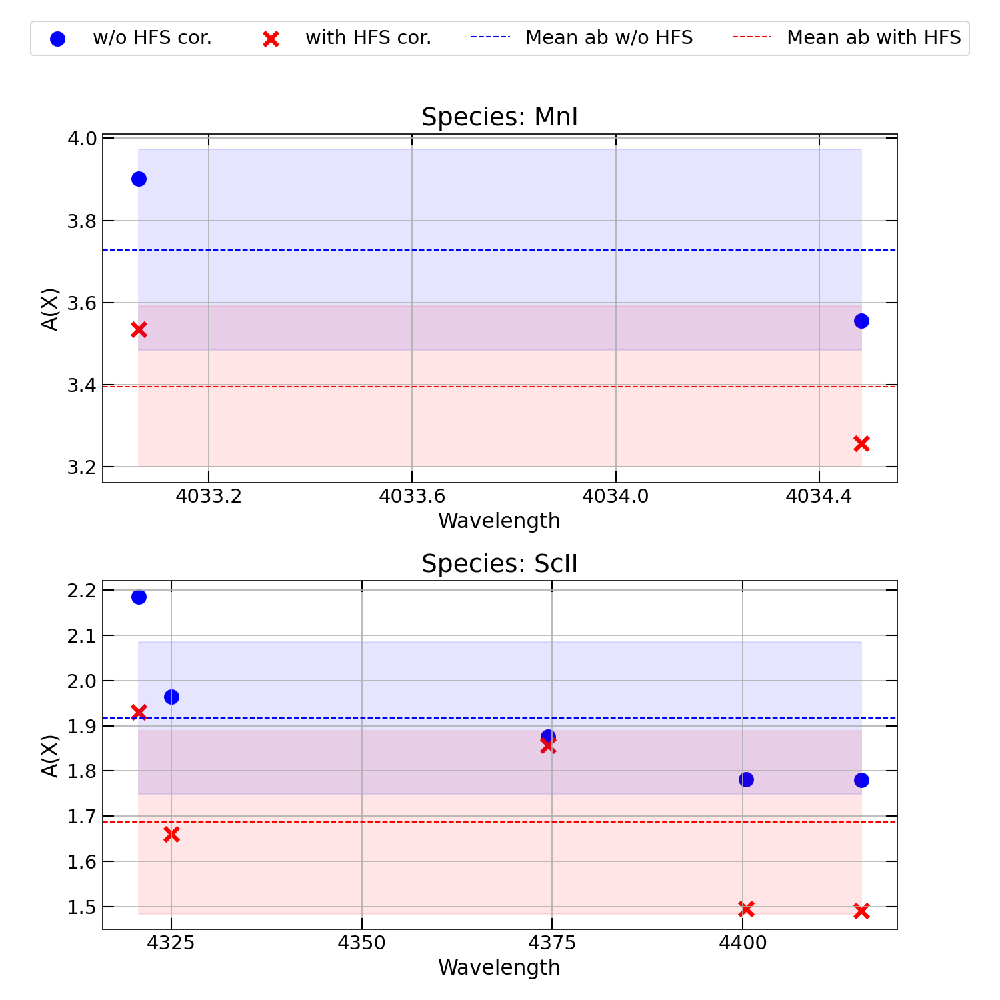

In [22]:
%matplotlib nbagg

species_ids = hfs_cor_df['id'].unique()

n_species = len(species_ids)
fig, axs = plt.subplots(n_species, 1, figsize=(10, 5 * n_species), sharex=False) #adjust if needed

if n_species == 1:
    axs = [axs]

for i, (ax, species_id) in enumerate(zip(axs, species_ids)):
    species_df = hfs_cor_df[hfs_cor_df['id'] == species_id]
    
    # Calculate means and std
    mean_ab = species_df['ab'].mean()
    std_ab = species_df['ab'].std()
    mean_ab_hfs = species_df['ab_hfscor'].mean()
    std_ab_hfs = species_df['ab_hfscor'].std()

    ax.scatter(species_df['ww'], species_df['ab'], label='w/o HFS cor.', color='blue', marker='o')
    ax.scatter(species_df['ww'], species_df['ab_hfscor'], label='with HFS cor.', color='red', marker='x')

    ax.axhline(y=mean_ab, color='blue', linestyle='--', linewidth=1, label='Mean ab w/o HFS')
    ax.fill_between([min(species_df['ww']), max(species_df['ww'])], mean_ab-std_ab, mean_ab+std_ab, color='blue', alpha=0.1)

    ax.axhline(y=mean_ab_hfs, color='red', linestyle='--', linewidth=1, label='Mean ab with HFS')
    ax.fill_between([min(species_df['ww']), max(species_df['ww'])], mean_ab_hfs-std_ab_hfs, mean_ab_hfs+std_ab_hfs, color='red', alpha=0.1)

    if i == 0:
        ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.35), ncol=4)
    
    
    ax.set_title(f'Species: {sp_map_reverse.get(species_id)}', fontsize = 18)
    ax.set_xlabel('Wavelength')
    ax.set_ylabel('A(X)')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=5)) 
    ax.grid(True)

    
plt.tight_layout()

### Save average HFS-corrected moog abundances with errors

Function `get_all` will calculate abundances for all the stars (if there are several), as well as errors and save the resulting fille to **moog_out_others_total_err.csv** within moog_output folder.

Columns e_X  contain the 1-sigma line-to-line scatter of the elemental abundances, while n_X represent the number of lines employed in these calculations.

A more proper error calculation for the abundances must include the propagation of errors from the stellar parameters. This is achieved by setting the errors flag to True.

In [23]:
q2.abundances.get_all(data, f'{moog_out_path}/moog_out_others_average_hfs_cor_err.csv', grid='marcs', errors=True)

------------------------------------------------------
Initializing ...
- Date and time: 06-Nov-2024, 19:27:02
- Model atmospheres: marcs
- Star data: HD222925_solution.csv
- Line list: lines.csv
------------------------------------------------------
"species_ids" not provided
Lines found for the following species: MgI,KI,CaI,ScII,CrI,MnI,NiI,ZnI,YII,ZrII,BaII,LaII,CeII,NdII,SmII,EuII,DyII


********
HD222925
********
Using [Fe/H] = -1.500 for the model atmosphere

MgI
---
ABS =  6.536 +/-  0.128 , n = 6
ERR = 0.099 (ABS)

Wavelength   ABS    RES 
----------  ----- ------
 4571.0960  6.401 -0.135
 5528.4050  6.488 -0.048
 4702.9910  6.489 -0.047
 4167.2710  6.604  0.068
 4057.5050  6.788  0.252
 5711.0880  6.448 -0.088

KI
--
ABS =  4.243 +/-  0.117 , n = 2
ERR = 0.152 (ABS)

Wavelength   ABS    RES 
----------  ----- ------
 7664.9110  4.360  0.117
 7698.9740  4.126 -0.117

CaI
---
ABS =  5.041 +/-  0.155 , n = 7
ERR = 0.103 (ABS)

Wavelength   ABS    RES 
----------  ----- ------
 61

### Add column with hfs corrections to the file with lbl abundances

In [24]:
l_by_l_abund_all_hfscor_df = pd.merge(l_by_l_abund_all_df, hfs_cor_df[['id', 'ww', 'ab_hfscor']], on=['id', 'ww'], how='left')
l_by_l_abund_all_hfscor_df['ab_hfscor'].fillna(np.nan, inplace=True)

#l_by_l_abund_all_hfscor_df.to_csv(f'{moog_out_path}/moog_out_others_lbl_hfscor.csv', index = False)

# 4. Apply NLTE corrections

At this point, we have all the  line by line abundances measured for each species with HFS corrections included. Now, we need to access the results of each species' abundance calculation and incorporate NLTE corrections data. 

In [25]:
from NLTE import apply_nlte
from data_processing_utils import sp_map

In [26]:
star_info = [teff, logg, feh, vt] 
#l_by_l_abund_all_hfscor_df = pd.read_csv(f'{moog_out_path}/moog_out_others_lbl_hfscor.csv')

nlte_results = apply_nlte(l_by_l_abund_all_hfscor_df, database='mpia', star_info=star_info, model_atmos='marcs', EW = True)

Element not available: 19.0
marcs is not available for Ca, using mafags-os instead
Element not available: 21.1
marcs is not available for 25.01, using mafags-os instead
Element not available: 28.0
Element not available: 30.0
Element not available: 39.1
Element not available: 40.1
Element not available: 56.1
Element not available: 57.1
Element not available: 58.1
Element not available: 60.1
Element not available: 62.1
Element not available: 63.1
Element not available: 66.1


In [52]:
nlte_results['line'] = nlte_results['line'].astype(l_by_l_abund_all_hfscor_df['ww'].dtype)
l_by_l_abund_all_hfs_nltecor_df = pd.merge(l_by_l_abund_all_hfscor_df, nlte_results, left_on='ww', right_on='line', how='left')
l_by_l_abund_all_hfs_nltecor_df.drop(columns=['line', 'ref', 'elem', 'difab'], inplace=True)

l_by_l_abund_all_hfs_nltecor_df.to_csv(f'{moog_out_path}/MOOG_OUT_OTHER_NLTE.csv', index=False)

l_by_l_abund_all_hfs_nltecor_df

,id,ww,ep,ew,rew,ab,err_ab,ab_hfscor,nlte_delta
0,56.10,5853.668,0.60,99.5,-4.770,1.379,0.123026,NaN,999.0
1,20.01,6122.217,1.88,105.0,-4.766,5.282,0.103092,NaN,0.076
2,20.01,6102.723,1.88,67.4,-4.957,5.167,0.103092,NaN,0.159
3,20.01,6162.173,1.90,114.7,-4.730,4.950,0.103092,NaN,0.008
4,20.01,6169.563,2.52,45.0,-5.137,4.839,0.103092,NaN,0.082
...,...,...,...,...,...,...,...,...,...
63,30.00,4722.150,4.03,33.1,-5.154,3.119,0.072064,NaN,999.0
64,30.00,4810.530,4.08,41.0,-5.069,3.086,0.072064,NaN,999.0
65,40.10,4258.041,0.56,92.4,-4.664,2.641,0.302133,NaN,999.0
66,40.10,4208.980,0.71,73.5,-4.758,1.743,0.302133,NaN,999.0


#### <span style="color: red;">NOTE:</span> You need to manually include NLTE corrections for certain species (e.g., Na, K, Ba ...). This can be done by editing the last column in MOOG_OUT_OTHER_NLTE.csv file

### Plot NLTE corrections per line for each species to see how they are distributed

<IPython.core.display.Javascript object>


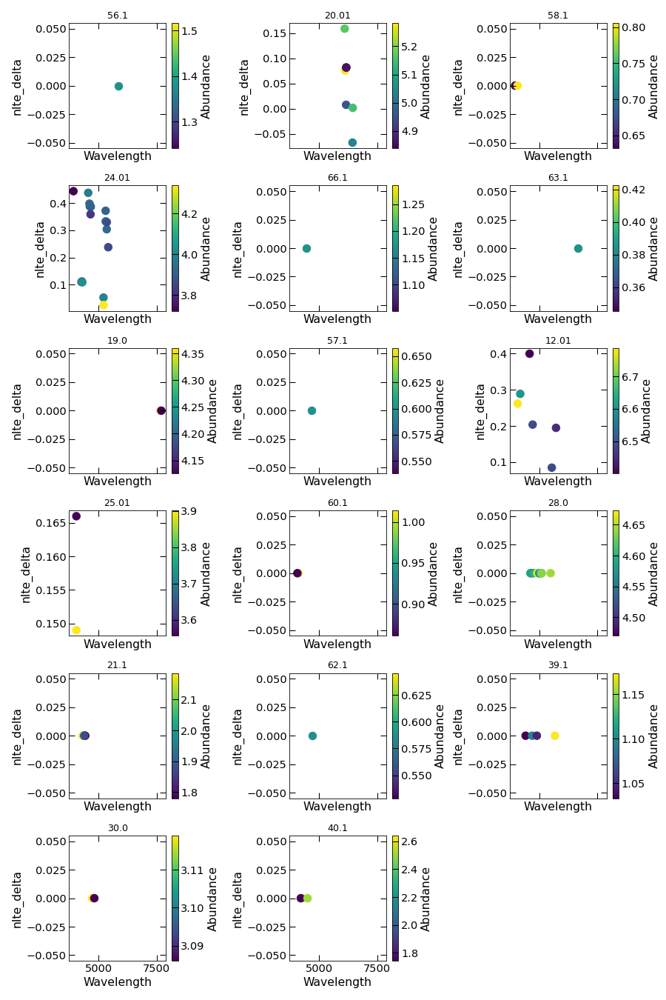

In [53]:
%matplotlib nbagg
df = l_by_l_abund_all_hfs_nltecor_df
df['nlte_delta'] = pd.to_numeric(df['nlte_delta'], errors='coerce')
df.loc[df['nlte_delta'] == 999.0, 'nlte_delta'] = 0  # Set nlte_delta to 0 if its value is 999.0
species = df['id'].unique()

num_species = len(species)
num_cols = 3 
num_rows = -(-num_species // num_cols)  


fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 3*num_rows), sharex=True)
for i, sp in enumerate(species):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    sp_data = df[df['id'] == sp]
    scatter = ax.scatter(sp_data['ww'], sp_data['nlte_delta'], c=sp_data['ab'], cmap='viridis')
    ax.set_ylabel('nlte_delta')
    ax.set_title(sp)
    ax.set_xlabel('Wavelength')
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Abundance')

for i in range(num_species, num_rows*num_cols):
    axes.flatten()[i].remove()

plt.tight_layout()
plt.show()


## Make abundance plots

In [27]:
from background_tmp import *

/arc5/home/dariazaremba/PY_LOOPER/moog_q2/background_tmp.py:974: DtypeWarning: Columns (12,15,18,21,24,27,30,36,39,42,45,48,51,54,57,60,63,66,69,72,75,81,84,87,90,99,102,105,111,114,117,123,126,129,135,138,141,144,147,150,153,159,162,165,168,171,174,177,180,186,189,195,198,204,207,213,216,219,222,225,228,231,234,240,243,246,249,255,264,267,270,273,276,279,282,285,288,291,294,297,300,303,309,315,318,321,324,330,333,336,339,342,345,348,351,354,360,363,366,372,375,378,381,384,387,390,393,396,399,402,408,411,417,420,423,426,429,432,435,438,441,444,447,450,453,456,459,462,465,468,474,477) have mixed types. Specify dtype option on import or set low_memory=False.
  df_halo = pd.read_csv('abund_literature/txt_table_recommended_v2021_MW.tsv', sep='\t')
/arc5/home/dariazaremba/PY_LOOPER/moog_q2/background_tmp.py:980: DtypeWarning: Columns (12,15,18,21,24,27,30,36,39,42,45,48,51,54,57,60,63,66,69,72,75,81,84,87,90,99,102,105,111,114,117,123,126,129,135,138,141,144,147,150,153,156,159,162,165,168,

### Get metallicity from previous Fe measurements (both LTE and NLTE)

In [28]:
fe = pd.read_csv(f'{moog_out_path}/MOOG_OUT_Fe_NLTE_final.csv')
fe_sol = AX_sol['FeI'][0]
fe['nlte_delta'] = fe['nlte_delta'].replace(999, 0)
#LTE:
feI = fe[fe['id'] == 26.01]
feII = fe[fe['id'] == 26.02]
afeI = np.mean(feI['ab'])
afeII = np.mean(feI['ab'])
w1 = len(feI)
w2 = len(feII)
afe_w_av = (w1 * afeI + w2 * afeII) / (w1 + w2)
feh = afe_w_av - fe_sol

#The combined A(Fe) error using a weighted sum of squared errors of A(FeI), A(FeII)
efe1 = solution_df['err_feh1']/np.sqrt(solution_df['nfe1'])
efe2 = solution_df['err_feh2']/np.sqrt(solution_df['nfe2'])

tot_err_feh = np.sqrt(((efe1**2) * solution_df['nfe1'] + (efe2**2) * solution_df['nfe2']) / (solution_df['nfe1'] + solution_df['nfe2']))

feh_err = tot_err_feh.iloc[0]

print(f'A(Fe) = {afe_w_av:.2f}')
print(f'[Fe/H] = {feh:.2f} ± {feh_err:.2f}')

#NLTE:
afeI_nlte = np.mean(feI['ab'] + feI['nlte_delta']) 
afe_w_av_nlte = (w1 * afeI_nlte + w2 * afeII) / (w1 + w2)
feh_nlte = afe_w_av_nlte - fe_sol

print(f'A(Fe)_NLTE = {afe_w_av_nlte:.2f}')
print(f'[Fe/H]_NLTE = {feh_nlte:.2f} ± {feh_err:.2f}')

A(Fe) = 5.97
[Fe/H] = -1.53 ± 0.02
A(Fe)_NLTE = 6.14
[Fe/H]_NLTE = -1.36 ± 0.02


## Compare with MW halo


### To get an initial assessment of your derived abundances, plot them against Milky Way halo stars from the SAGA database and the Li et al. 2022 dataset

In [36]:
abund_df = pd.read_csv(f'{moog_out_path}/moog_out_others_average_hfs_cor_err.csv')

In [44]:
# Check if all solar abundances are available for the species in your dataset. Add missing values from Asplund et al. 2009, if needed

missing_species = []
for sp in available_species:
    if sp not in AX_sol:
        missing_species.append(sp)

if missing_species:
    print(f'Species missing in AX_sol: {", ".join(missing_species)}')
else:
    print('All species have values in AX_sol.')

Species missing in AX_sol: DyII


<IPython.core.display.Javascript object>


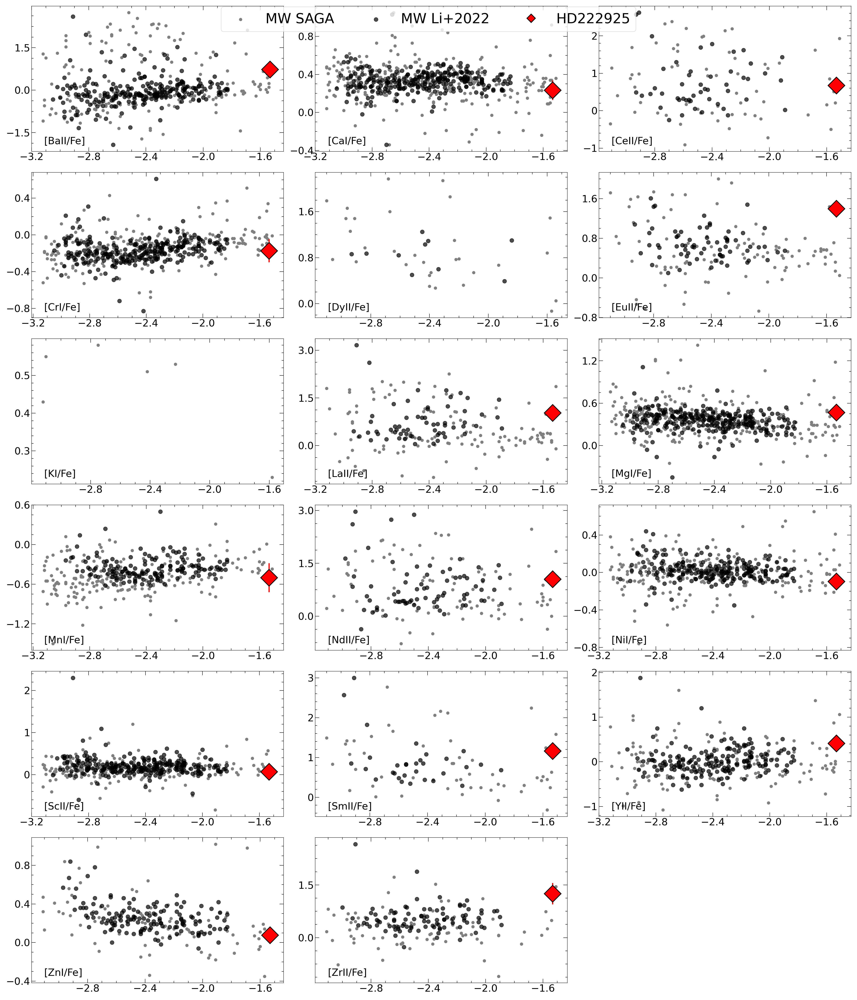

In [68]:
%matplotlib nbagg

E = available_species
EFE, F, D, EH = generate_arrays(E)
num_plots = len(EFE)
num_cols = min(num_plots, 3)
num_rows = (num_plots + num_cols - 1) // num_cols

fig = plt.figure(figsize=(30, 35))
fs = 25  # fontsize

legend_entries = {} #For plotting legend

for i in range(num_plots):
    ax = plt.subplot(num_rows, num_cols, i + 1)
    if F[i] in df_halo.columns and EH[i] in df_halo.columns and D[i] in df_halo.columns:

        # Select stars with good measurements in the SAGA sample for each species
        igood_aux = np.logical_and(df_halo['f(Fe I)'] != '<', df_halo['f(Fe I)'] != '>')
        igood_aux2 = np.logical_and(df_halo['[Fe I/H]'] < -1.5, df_halo['[Fe I/H]'] > -3.15)
        igood_aux3 = np.logical_and(igood_aux, igood_aux2)
        igood_aux4 = np.logical_and(df_halo[F[i]] != '<', df_halo[F[i]] != '>')
        igood_aux5 = np.logical_and(igood_aux3, igood_aux4)
        igood_EH_halo = np.logical_and(igood_aux5, df_halo[D[i]] < 0.2)
        FE_halo = np.array(df_halo['[Fe I/H]'][igood_EH_halo])
        EFE_halo = np.array(df_halo[EH[i]][igood_EH_halo]) - FE_halo

        sc = ax.scatter(FE_halo, EFE_halo, s=50, marker='o', color='grey', label='MW SAGA')
        legend_entries['MW SAGA'] = sc
        
    if (E[i] in li.columns) and (li[E[i]] != -99.99).all():
        sc = ax.scatter(li['FeI'], li[E[i]] - li['FeI'], s=100, marker='o', color='black', label='MW Li+2022', alpha=0.7)
        legend_entries['MW Li+2022'] = sc        
        
        #### ADD YOUR DATA
        
        if E[i] in abund_df and E[i] in AX_sol:
            AX = abund_df[E[i]]
            XH = AX - AX_sol[E[i]][0]
            XFE = XH - feh
            XFE_err = abund_df[f'err_{E[i]}']
            ax.errorbar(feh, XFE, xerr=feh_err, yerr=XFE_err, marker='D', color='red', markeredgecolor='k', ms=30)
        
            legend_entries[star_id] = plt.Line2D([0], [0], marker='D', color='red', markeredgecolor='k', markersize=15, linestyle='None', label=star_id)
        
        #NLTE: To be added
        
        
    ax.text(0.05, 0.05, f'[{E[i]}/Fe]', fontsize=fs, transform=ax.transAxes)
    
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)
    plt.minorticks_on()
    
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=False, nbins=4))
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=False, nbins=5))
    
    plt.tick_params(axis='both', which='major', length=10, width=1, direction='in', top=1, right=1)
    plt.tick_params(axis='both', which='minor', length=5, width=1, direction='in', top=1, bottom=1, right=1)
    


fig.legend(handles=legend_entries.values(), fontsize = 35, loc='upper center', bbox_to_anchor=(0.5, 1.00), ncol = 3)    
plt.tight_layout()

